

##### MBA In AI/BigData
### AI Business Cases
#### Topic 1. Robo advisory
##### March 5, 2022


### Library import

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.io
plotly.io.renderers.default = "colab" # required to use local runtime in Colab

import time
from timeit import default_timer as timer

pd.options.display.max_colwidth = 100
pd.options.display.float_format = '{:.4f}'.format

random_state = 1
np.random.seed = random_state

In [ ]:
# functions for cost measure

def print_time(time):
    print('Time taken (seconds): ', time)

In [ ]:
# functions for charting

def add_zeroline(*args, **kwargs):
    ax = plt.gca()
    ax.axvline(0, color='firebrick', lw=1)
    ax.axhline(0, color='firebrick', lw=1)

def time_heatmap(x, y, **kwargs):
    ax = plt.gca()
    sns.scatterplot(x=x, y=y, s=30, ax=ax, **kwargs)

### Data Preprocessing

#### Fundamental data

Download financial statements for 2020

In [ ]:
# Data fetched from Bloomberg
# https://docs.google.com/spreadsheets/d/17kGWOMfMnfAF7wHbpXymhZytfdM5W89WOOROlvqZcgw/edit#gid=1060252032
sheet_id = '17kGWOMfMnfAF7wHbpXymhZytfdM5W89WOOROlvqZcgw'
sheet_name = 'FundamentalData'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'

data_fundamental = pd.read_csv(url)
# notation adjustment: BRK/B US Equity > BRK-B
data_fundamental['Security Name'] = data_fundamental['Security Name'].str.replace('/','-').apply(lambda x: x.split()[0])
data_fundamental.fillna(0, inplace=True) # most analytics, including PCA, FA, regression, does not accept nan values
data_fundamental.head()

,Year,Security Name,GICS Sector,GICS Industry,Market capitalization,AGG_Revenue,Sales & Services Revenue,Financing Revenue,Other Revenue,AGG_Cost of Revenue,...,AGG_Cash (Repurchase) of Equity,Increase in Capital Stock,Decrease in Capital Stock,Other Financing Activities,Net Cash From Disc Ops.2,AGG_Cash from Financing Activities,Effect of Foreign Exchange Rates,AGG_Net Changes in Cash,AGG_Cash Paid for Taxes,AGG_Cash Paid for Interest
0,2020,A,Health Care,Life Sciences Tools & Services,"40,493",5339.0000,5339.0000,0.0000,0.0000,2502.0000,...,-409.0000,60.0000,-469.0000,-41.0000,0.0000,-717.0000,2.0000,59.0000,361.0000,71.0000
1,2020,AAL,Industrials,Airlines,"15,329",17337.0000,15287.0000,0.0000,2050.0000,0.0000,...,2797.0000,2970.0000,-173.0000,-5.0000,0.0000,10994.0000,0.0000,109.0000,6.0000,944.0000
2,2020,AAP,Consumer Discretionary,Specialty Retail,"13,071",10106.3210,10106.3210,0.0000,0.0000,5621.5460,...,-466.4210,3.2700,-469.6910,-7.7530,0.0000,-285.9970,-0.4670,416.3270,146.0730,34.0110
3,2020,AAPL,Information Technology,"Technology Hardware, Storage & Peripherals","2,022,547",274515.0000,274515.0000,0.0000,0.0000,169559.0000,...,-71478.0000,880.0000,-72358.0000,-3634.0000,0.0000,-86820.0000,0.0000,-10435.0000,9501.0000,3002.0000
4,2020,ABBV,Health Care,Biotechnology,"191,080",45804.0000,45804.0000,0.0000,0.0000,13980.0000,...,-769.0000,209.0000,-978.0000,-333.0000,0.0000,-11501.0000,-5.0000,-31475.0000,1674.0000,2619.0000


In [ ]:
# create industry-security color map for future use
security_industry_map = data_fundamental[data_fundamental['Year'] == 2020][['Security Name', 'GICS Sector']].set_index(['Security Name']).to_dict()['GICS Sector']
industries_exc_financial = list(set(security_industry_map.values()) - set(['Financials']))
industry_colors = sns.color_palette('tab10', len(industries_exc_financial))

# dict of name-code pair
industry_colorcode = dict([(idu, idx) for idx, idu in enumerate(industries_exc_financial)])
security_colorcode = dict([(sec, industry_colorcode.get(idu, 0)) for sec, idu in security_industry_map.items()])

# list of RGB 3-tuple
industry_colormap = [industry_colors[idx] for idu, idx in industry_colorcode.items()]

# dict of name-RGB 3-tuple pair
security_colormap = dict([(sec, industry_colors[idx]) for sec, idx in security_colorcode.items()])

# check industry-wide sample size (for 6 years)
data_fundamental['GICS Sector'].value_counts()

Industrials               511
Information Technology    511
Financials                455
Health Care               441
Consumer Discretionary    434
Consumer Staples          224
Real Estate               210
Utilities                 196
Materials                 196
Communication Services    182
Energy                    175
Name: GICS Sector, dtype: int64

Select only aggregation accounts excluding subset items to avoid multi-collinearity


In [ ]:
accounts_selected = list(data_fundamental.columns)
accounts_selected = [field for field in accounts_selected if field[:4] == 'AGG_']

data_fundamental_select = data_fundamental[data_fundamental['GICS Sector'] != 'Financials'][accounts_selected].copy()
data_fundamental_select.columns = [field.replace('AGG_','') for field in data_fundamental_select.columns]
accounts_selected = list(data_fundamental_select.columns)

data_fundamental_select.insert(0, 'GICS Sector', data_fundamental['GICS Sector'])
data_fundamental_select['Security Name'] = data_fundamental['Security Name']
data_fundamental_select['Year'] = data_fundamental['Year']
data_fundamental_select.set_index(['Year', 'Security Name'], inplace=True)
data_fundamental_select.describe()

,Revenue,Cost of Revenue,Gross Profit,Operating Expenses,Operating Income (Loss),NonOperating (Income) Loss,"Pretax Income (Loss), Adjusted",Abnormal Losses (Gains),"Pretax Income (Loss), GAAP","Income Tax Expense (Benefit), GAAP",...,Change in Fixed & Intang,Net Change in LT Investment,Net Cash From Acq & Div,Cash from Investing Activities,Cash From (Repayment) Debt,Cash (Repurchase) of Equity,Cash from Financing Activities,Net Changes in Cash,Cash Paid for Taxes,Cash Paid for Interest
count,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,...,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000,3080.0000
mean,21777.7973,13770.0529,7119.9355,4989.3979,2927.2246,189.0127,2737.5174,426.9938,2737.5174,610.5796,...,-1095.7423,-47.5864,-590.9383,-2023.8197,616.3544,-902.6164,-1240.5556,168.7544,525.1918,353.3348
std,43116.4798,33216.1151,13743.8672,9637.1643,5570.9832,1089.2316,5549.6375,1735.3892,5549.6375,1335.5966,...,2758.2341,1512.5612,2729.6678,5478.6480,3541.8900,3355.5507,5509.6419,2647.8924,1193.9793,656.9068
min,0.0000,0.0000,-17995.0000,-7814.6582,-11387.0000,-17548.0000,-12249.0000,-12979.4615,-12249.0000,-9093.3000,...,-35044.0000,-30455.0000,-43309.0000,-63145.0000,-58411.0000,-72069.0000,-90976.0000,-45532.0000,-2955.0000,0.0000
25%,3767.6263,1230.7912,1306.5798,825.3395,628.9750,10.5548,529.6000,0.0000,529.6000,89.5848,...,-850.8578,0.0000,-256.9303,-2056.1348,-141.0315,-741.6857,-1419.2500,-120.2022,34.9855,45.9933
50%,8674.0500,3935.0000,2839.5000,1952.5000,1247.9150,106.7265,1067.7555,57.6433,1067.7555,247.5658,...,-281.0220,0.0000,-6.1710,-646.1500,21.1280,-158.1085,-365.0025,28.2180,162.4310,155.8000
75%,18276.5000,9952.8845,6618.5000,4841.7500,2851.7500,346.4500,2527.4620,312.2500,2527.4620,599.7500,...,-76.5028,0.0000,0.0000,-195.8000,770.5200,0.0000,0.0000,315.2102,453.1248,393.7750
max,559151.0000,420315.0000,152757.0000,129858.0000,71230.0000,10497.0000,72647.0000,27637.0000,72647.0000,19152.8500,...,9269.0000,41005.0000,11298.0000,59488.0000,38265.0000,12686.0000,36819.0000,44997.0000,18085.0000,9539.0000


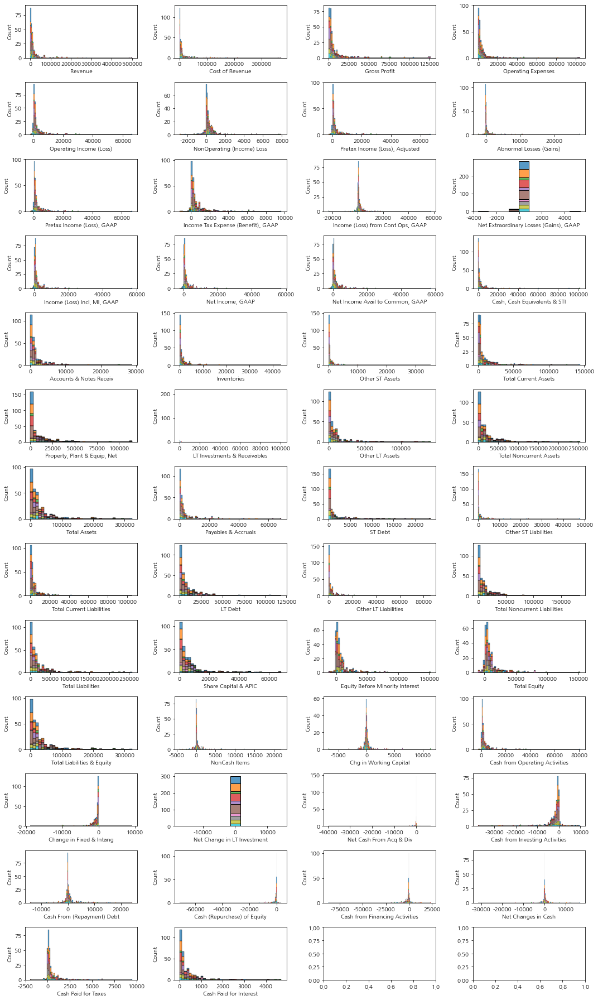

In [ ]:
# check distributions in raw data
fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,25))
data = data_fundamental_select.copy().sample(frac=0.1, random_state=random_state) # sample to reduce computational cost

for idx, account in enumerate(accounts_selected):
    ax = axes.flatten()[idx]
    bins_ = np.histogram_bin_edges(data[account], bins='auto')
    sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
    ax.get_legend().set_visible(False)

plt.tight_layout()
plt.show()

Highly skewed data, standardizing won't cure it \\
How about log transform?

Trouble: some accounts have negative values keeping us from log transforming
* (Non)Operating Income
* Chg in Working Capital
* Cash-flow generating activities

Our research shows that possible fixes are:
* Transition: add a constant to all values so that it starts from 0
* Ignore: ignore negative values literally

We cannot accept both however.
* Transition doesn't seem to be a good fit here - we can see that negative values forms a distribution by itself.
* Negative income (loss) has its meaning, so cannot be ignored.

So what? \\
use symmetric logged values instead

<ipython-input-637-3d9a4be62ae3>:12: RuntimeWarning:

invalid value encountered in log



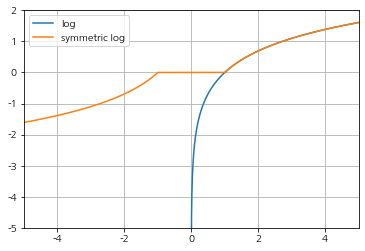

In [ ]:
def symmetric_log(x):
    # mute RuntimeWarning errors raised by log operation on 0 or nan
    # https://stackoverflow.com/questions/21610198/runtimewarning-divide-by-zero-encountered-in-log
    with np.errstate(divide='ignore', invalid='ignore'):
        # x=0 is replaced by nan: set to 0 afterwards (after standardization)
        # x from -1 to 1 shifted to 0
        return np.where(np.sign(x) == 1, np.maximum(np.log(x),0), np.where(np.sign(x) == 0, np.nan, np.minimum(-np.log(-x),0)))

# illustrate example of symmetric log, which resembles logarithmetic movement for negative x while ignoring [-1, 1] interval
x = np.linspace(-5, 5, 10000)

plt.plot(x, np.log(x), label='log')
plt.plot(x, symmetric_log(x), label='symmetric log')
plt.xlim(x.min(), x.max())
plt.ylim(-5, 2)

plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# check distributions in logged data

data_fundamental_log = data_fundamental_select[accounts_selected].apply(symmetric_log)
data_fundamental_log['GICS Sector'] = data_fundamental_select['GICS Sector']

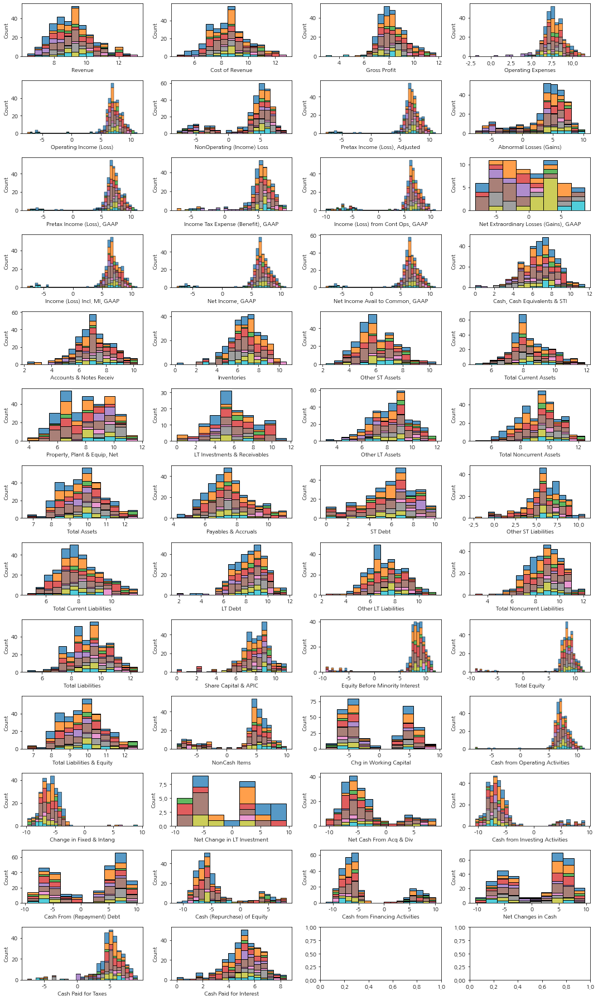

In [ ]:
fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,25))
data = data_fundamental_log.copy().sample(frac=0.1, random_state=random_state)

for idx, account in enumerate(accounts_selected):
    ax = axes.flatten()[idx]
    bins_ = np.histogram_bin_edges(data[account], bins='auto',
        # adjust min~max range ignoring nan value
        range=(np.nanmin(data[account]), np.nanmax(data[account]))
    )
    sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
    ax.get_legend().set_visible(False)

plt.tight_layout()
plt.show()

Data distribution after log transformation seems approximately normal - except that some accounts are consist of two separate distributions distinguished by positive and negative values.

As we need normally distributed variables for further analysis such as PCA and Factor Analysis, we separate those accounts into two parts.

In [ ]:
data = data_fundamental_log.copy()

def split_variable(data, vars):
    for var in vars:
        col_idx = list(data.columns).index(var)
        data.insert(col_idx, var + ' (+)', np.where(data[var] >= 0, data[var], np.nan))
        data.insert(col_idx+1, var + ' (-)', np.where(data[var] < 0, data[var], np.nan))
    data.drop(vars, axis=1, inplace=True)
    return data

column_to_split = [
    #'Gross Profit', # exception: number of sample is too small
    'Operating Income (Loss)',
    'NonOperating (Income) Loss',
    'Pretax Income (Loss), Adjusted',
    'Abnormal Losses (Gains)',
    'Pretax Income (Loss), GAAP',
    'Income Tax Expense (Benefit), GAAP',
    'Income (Loss) from Cont Ops, GAAP',
    'Net Extraordinary Losses (Gains), GAAP',
    'Income (Loss) Incl. MI, GAAP',
    'Net Income, GAAP',
    'Net Income Avail to Common, GAAP',
    #'Share Capital & APIC',
    'Equity Before Minority Interest',
    'Total Equity',
    'NonCash Items',
    'Chg in Working Capital',
    'Cash from Operating Activities',
    'Change in Fixed & Intang',
    'Net Change in LT Investment',
    'Net Cash From Acq & Div',
    'Cash from Investing Activities',
    'Cash From (Repayment) Debt',
    'Cash (Repurchase) of Equity',
    'Cash from Financing Activities',
    'Net Changes in Cash',
    'Cash Paid for Taxes',
]

data_fundamental_split = split_variable(data, column_to_split)
accounts_selected = list(data_fundamental_split.columns)
accounts_selected.remove('GICS Sector')

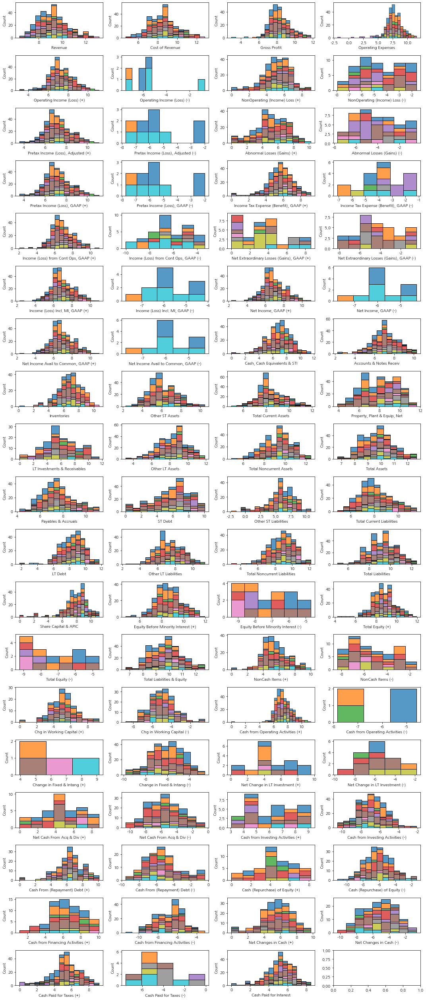

In [ ]:
fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,35))
data = data_fundamental_split.copy().sample(frac=0.1, random_state=random_state)

for idx, account in enumerate(accounts_selected):
    ax = axes.flatten()[idx]
    bins_ = np.histogram_bin_edges(data[account], bins='auto',
        # adjust min~max range ignoring nan value
        range=(np.nanmin(data[account]), np.nanmax(data[account]))
    )
    sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
    ax.get_legend().set_visible(False)

plt.tight_layout()
plt.show()

Feature scaling is essential for PCA for Factor analysis

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

data = data_fundamental_split.copy()

scaler_std = StandardScaler()
scaler_minmax = MinMaxScaler()
scaler_robust = RobustScaler()

data_fundamental_log_std = scaler_std.fit_transform(data[accounts_selected])
data_fundamental_log_std = pd.DataFrame(data_fundamental_log_std, columns=accounts_selected, index=data.index)
data_fundamental_log_std['GICS Sector'] = data['GICS Sector']

data_fundamental_log_minmax = scaler_minmax.fit_transform(data[accounts_selected])
data_fundamental_log_minmax = pd.DataFrame(data_fundamental_log_minmax, columns=accounts_selected, index=data.index)
data_fundamental_log_minmax['GICS Sector'] = data['GICS Sector']

data_fundamental_log_robust = scaler_robust.fit_transform(data[accounts_selected])
data_fundamental_log_robust = pd.DataFrame(data_fundamental_log_robust, columns=accounts_selected, index=data.index)
data_fundamental_log_robust['GICS Sector'] = data['GICS Sector']

# nan values set to 0 to prevent analytic errors
# that is, missing values are regarded as the mean of other samples
data_fundamental_log_std.fillna(0, inplace=True)
data_fundamental_log_minmax.fillna(0, inplace=True)
data_fundamental_log_robust.fillna(0, inplace=True)

Substituting the missing values for 0, it turns out some features are imbalanced. (Too many zeros distorts the shape of distribution.) At this point, we may consider removing the feature. \\
This can't be a magical solution here, however, considering the given dataset is financial statements. Some accounts are used only by a few specific industries - while not for the most.
If it's the case, it will be a valueable source of information too imporant to eliminate.

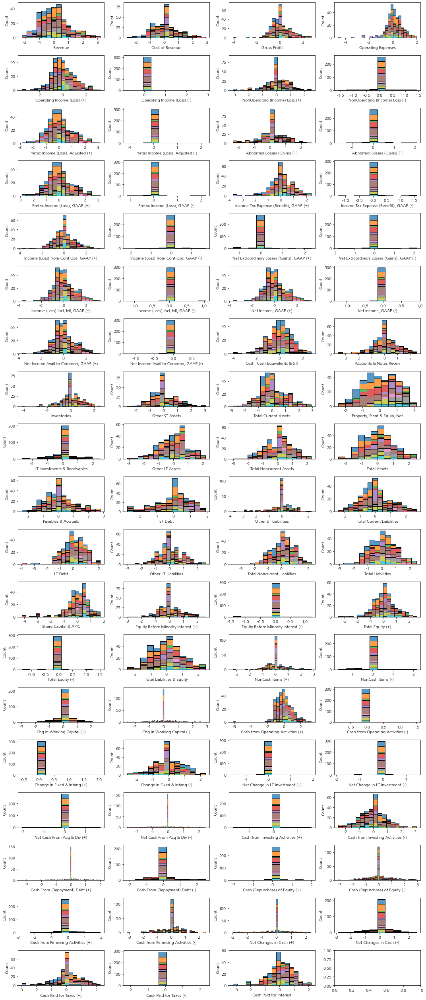

In [ ]:
# check distributions in standardized data
fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,35))
data = data_fundamental_log_std.copy().sample(frac=0.1, random_state=random_state)

for idx, account in enumerate(accounts_selected):
    ax = axes.flatten()[idx]
    bins_ = np.histogram_bin_edges(data[account], bins='auto',
        range=(np.nanmin(data[account]), np.nanmax(data[account]))
    )
    sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
    ax.get_legend().set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
# # check distributions in normalized(min-max) data
# fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,35))
# data = data_fundamental_log_minmax.copy().sample(frac=0.1, random_state=random_state)

# for idx, account in enumerate(accounts_selected):
#     ax = axes.flatten()[idx]
#     bins_ = np.histogram_bin_edges(data[account], bins='auto',
#         range=(np.nanmin(data[account]), np.nanmax(data[account]))
#     )
#     sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
#     ax.get_legend().set_visible(False)

# plt.tight_layout()
# plt.show()

In [ ]:
# # check distributions in robust-standardized data (with median)
# fig, axes = plt.subplots(ncols=4, nrows=int(np.floor(len(accounts_selected)/4))+1, figsize=(15,35))
# data = data_fundamental_log_robust.copy().sample(frac=0.1, random_state=random_state)

# for idx, account in enumerate(accounts_selected):
#     ax = axes.flatten()[idx]
#     bins_ = np.histogram_bin_edges(data[account], bins='auto',
#         range=(np.nanmin(data[account]), np.nanmax(data[account]))
#     )
#     sns.histplot(data=data, x=account, stat='count', bins=bins_, hue='GICS Sector', palette=industry_colormap, multiple='stack', ax=ax)
#     ax.get_legend().set_visible(False)

# plt.tight_layout()
# plt.show()

Check correlation for explainatory purpose only
* Correlation: 1 on 1, only linearity
* Regression coefficient: 1 to many, size of effect

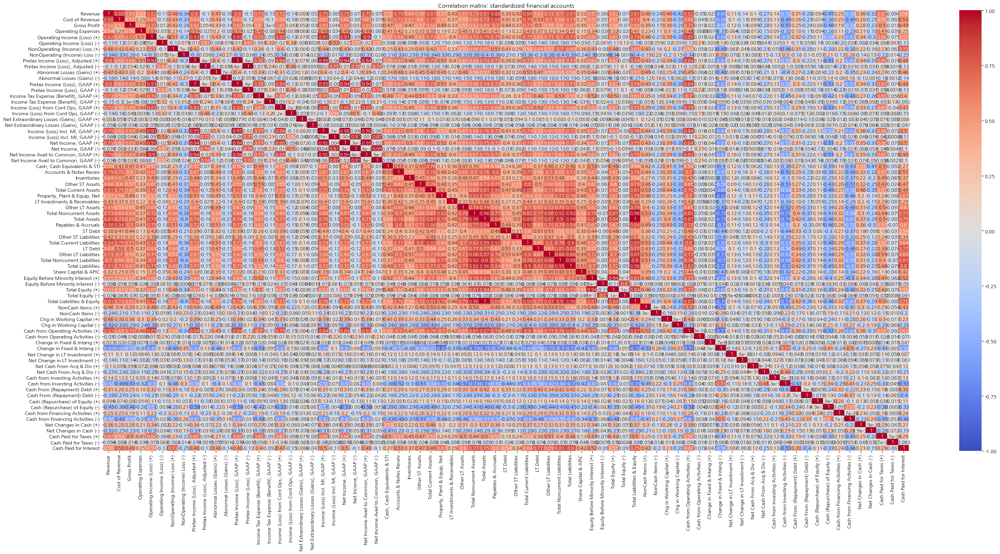

In [ ]:
data = data_fundamental_log_std.copy()

fig, axs = plt.subplots(1, 1, figsize=(32, 16))
sns.heatmap(data.corr(), cmap='coolwarm', vmin=-1, vmax=1, annot=True, ax=axs)
axs.set_title('Correlation matrix: standardized financial accounts')

plt.tight_layout()
plt.show()

Here we notice that quite some of accounts, especially subtotals, exhibit strong correlation with others. \\

In statistical point of view, variables with multicollinearity should be removed - Nevertheless, our financial domain knowledge keeps us from removing all of these because some of these have its own meaning. \\

For instance, Operating income and Net income has strong correlation in general by nature. However, Net income can be affected by several other factors too, especially in a highly-leveraged industry.

So, though it suggests the existence of multicollinearity, we may proceed with minimal adjustment as we expect that it can be dealt with subsequent PCA.

In [ ]:
column_to_remove = [
    'Pretax Income (Loss), Adjusted',
    'Pretax Income (Loss), GAAP',
    'Income (Loss) Incl. MI, GAAP',
    'Net Income Avail to Common, GAAP',
    'Total Current Assets',
    'Total Noncurrent Assets',
    'Total Assets',
    'Payables & Accruals',
    'Total Current Liabilities',
    'Total Noncurrent Liabilities',
    'Total Liabilities',
    'Total Liabilities & Equity',
    'Equity Before Minority Interest',
    'GICS Sector'
]
data = data_fundamental_log_std.copy()

accounts_reselected = list(data.columns)
accounts_reselected = [field for field in accounts_reselected if field.replace(' (+)','').replace(' (-)','') not in column_to_remove]

data_fundamental_reselect = data[accounts_reselected].copy()
data_fundamental_reselect['GICS Sector'] = data['GICS Sector']
data_fundamental_reselect = data_fundamental_reselect.reset_index().set_index(['Year', 'GICS Sector', 'Security Name'])
data_fundamental_reselect

Revenue  Cost of Revenue  \
Year GICS Sector            Security Name                             
2020 Health Care            A              -0.4394          -0.4759   
     Industrials            AAL             0.5027           0.0000   
     Consumer Discretionary AAP             0.0710           0.0740   
     Information Technology AAPL            2.7120           2.3878   
     Health Care            ABBV            1.2797           0.6928   
...                                            ...              ...   
2014 Industrials            XYL            -0.6874          -0.5033   
     Consumer Discretionary YUM            -0.2714          -0.1523   
     Health Care            ZBH            -0.5460          -0.9512   
     Information Technology ZBRA           -1.3686          -1.1757   
     Health Care            ZTS            -0.5271          -0.7464   

                                           Gross Profit  Operating Expenses  \
Year GICS Sector            Security Name                                     
2020 Health Care            A                   -0.2218              0.0180   
     Industrials            AAL                  0.0000              1.3826   
     Consumer Discretionary AAP                  0.1322              0.3785   
     Information Technology AAPL                 2.5698              1.5280   
     Health Care            ABBV                 1.6472              1.0773   
...                                                 ...                 ...   
2014 Industrials            XYL                 -0.7079             -0.2558   
     Consumer Discretionary YUM                 -0.3019             -0.6904   
     Health Care            ZBH                 -0.0750              0.0871   
     Information Technology ZBRA                -1.2221             -0.5777   
     Health Care            ZTS                 -0.1520              0.0698   

                                           Operating Income (Loss) (+)  \
Year GICS Sector            Security Name                                
2020 Health Care            A                                  -0.2575   
     Industrials            AAL                                 0.0000   
     Consumer Discretionary AAP                                -0.5054   
     Information Technology AAPL                                3.2104   
     Health Care            ABBV                                2.0375   
...                                                                ...   
2014 Industrials            XYL                                -0.8906   
     Consumer Discretionary YUM                                 0.3240   
     Health Care            ZBH                                -0.0346   
     Information Technology ZBRA                               -1.4617   
     Health Care            ZTS                                -0.2037   

                                           Operating Income (Loss) (-)  \
Year GICS Sector            Security Name                                
2020 Health Care            A                                   0.0000   
     Industrials            AAL                                -1.7792   
     Consumer Discretionary AAP                                 0.0000   
     Information Technology AAPL                                0.0000   
     Health Care            ABBV                                0.0000   
...                                                                ...   
2014 Industrials            XYL                                 0.0000   
     Consumer Discretionary YUM                                 0.0000   
     Health Care            ZBH                                 0.0000   
     Information Technology ZBRA                                0.0000   
     Health Care            ZTS                                 0.0000   

                                           NonOperating (Income) Loss (+)  \
Year GICS Sector            Security Name                                   
2020 Health

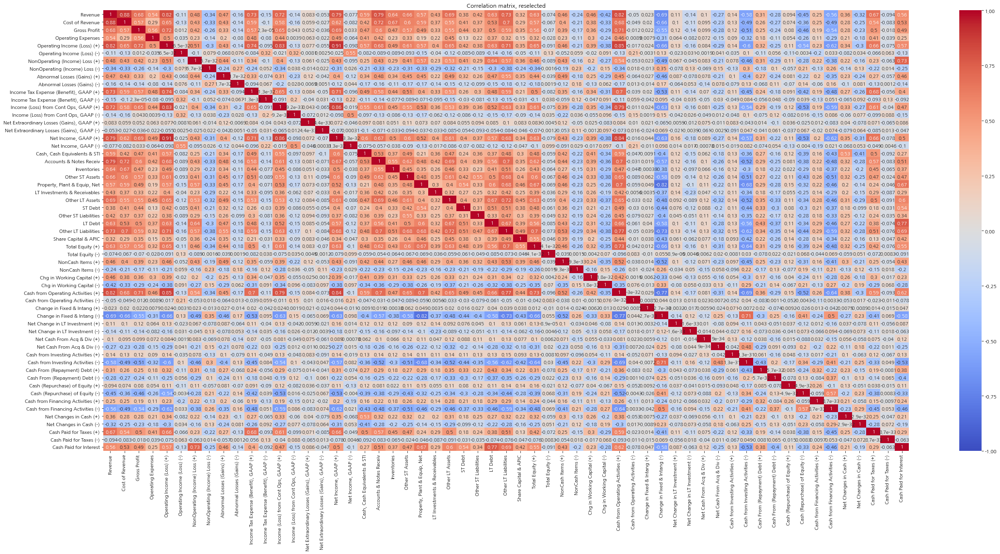

In [ ]:
data = data_fundamental_reselect.copy()

fig, axs = plt.subplots(1, 1, figsize=(32, 16))
sns.heatmap(data.corr(), cmap='coolwarm', vmin=-1, vmax=1, annot=True, ax=axs)
axs.set_title('Correlation matrix, reselected')

plt.tight_layout()
plt.show()

Removed stocks fall in GICS Financials sector

In [ ]:
ticker_list = list(data_fundamental['Security Name'].unique())
ticker_list_wo_financials = list(data_fundamental[data_fundamental['GICS Sector'] != 'Financials']['Security Name'].unique())

print('Number of tickers in S&P500:', len(ticker_list))
print('Number of tickers in S&P500 excluding Financials:', len(ticker_list_wo_financials))

Number of tickers in S&P500: 505
Number of tickers in S&P500 excluding Financials: 440


#### Stock return data

Download stock returns \\
Return errors for 7 stocks

In [ ]:
# Yahoo Finance
# https://pypi.org/project/yfinance/

import yfinance as yf

data_price = yf.download(
    tickers=ticker_list_wo_financials,
    start='2014-12-31',
    end='2020-12-31',
    interval='1d'
)['Adj Close']
data_price.dropna(how='all', inplace=True) # remove empty record (2014-12-30)

[*********************100%***********************]  440 of 440 completed

9 Failed downloads:
- CXO: No data found, symbol may be delisted
- KSU: No data found, symbol may be delisted
- ALXN: No data found, symbol may be delisted
- MXIM: No data found, symbol may be delisted
- VAR: No data found, symbol may be delisted
- TIF: No data found, symbol may be delisted
- FLIR: No data found, symbol may be delisted
- XLNX: No data found, symbol may be delisted
- INFO: No data found, symbol may be delisted


Turned out that all 7 companies are acquired by other companies after 2020-12-31 \\

Price data exists for 2015-2020 period, however.

In [ ]:
sheet_name = 'PriceData'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'

data_price_missing = pd.read_csv(url)
data_price_missing['Date'] = pd.to_datetime(data_price_missing['Date'], format='%Y-%m-%d')
data_price_missing.set_index('Date', inplace=True)

missing_price_tickers = ['CXO', 'TIF', 'ALXN', 'KSU', 'VAR', 'FLIR', 'MXIM']
for ticker in missing_price_tickers:
    data_price[ticker] = data_price[ticker].index.map(data_price_missing[ticker])

data_price.describe()

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,XEL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZTS
count,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,...,1511.0000,0.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000,1511.0000
mean,60.9966,35.5818,141.8437,46.3377,63.9955,83.8188,191.1577,58.7718,140.4397,208.6498,...,43.8665,nan,59.0813,51.6031,23.5252,58.3387,73.3974,112.8664,146.1102,80.7752
std,19.7801,11.4516,22.6195,25.3757,16.3070,8.8147,102.2183,21.4376,44.3442,120.7408,...,12.2647,nan,9.8271,7.6073,4.4050,18.1376,19.1010,14.1153,75.6399,37.0530
min,31.5726,9.0400,72.9857,21.0095,36.2448,62.8005,36.1300,32.4054,74.1199,69.9900,...,26.0444,nan,27.5257,31.2945,13.5026,27.9645,42.0959,77.0141,46.9300,37.7801
25%,42.7296,29.8990,133.7220,27.5066,48.5498,77.8628,104.9450,40.0726,104.2525,97.7100,...,34.4692,nan,58.5769,47.3635,20.7496,42.9529,57.0708,104.8246,85.0100,47.3371
50%,63.2238,37.7028,147.7060,39.6702,65.2124,82.7707,168.8100,53.3946,138.8355,184.1500,...,41.3318,nan,62.3982,53.1367,23.2960,62.9656,73.5143,110.8509,115.2300,70.5301
75%,73.3213,44.4068,155.9758,52.2288,77.8814,89.3499,271.0150,76.4984,172.3201,277.7800,...,55.2364,nan,65.2572,57.5544,26.4259,73.4290,88.8170,119.9680,200.5200,110.8141
max,118.2782,56.9887,192.9640,135.6796,101.7663,107.6213,449.7500,111.8365,261.5403,533.8000,...,71.6878,nan,71.2040,66.1619,35.4304,99.4984,114.0094,153.2067,383.7500,172.8140


In [ ]:
missing_data = data_price.loc[:, data_price.describe().loc['count',:] < 1258]
missing_period_tickers = list(missing_data.columns)

missing_data.describe()

,CARR,CTVA,DOW,FOX,FOXA,FTV,HWM,INFO,IR,LW,OTIS,UA,VNT,XLNX
count,199.0000,405.0000,451.0000,456.0000,457.0000,1132.0000,1048.0000,0.0000,916.0000,1041.0000,199.0000,1203.0000,68.0000,0.0000
mean,26.4890,27.8807,41.8086,30.2528,30.6469,57.6836,22.3416,nan,30.1574,59.6871,57.4219,19.2702,31.1528,nan
std,8.0018,3.8030,6.3956,4.3726,4.4934,8.5716,4.7627,nan,5.3669,14.1357,7.0536,7.8856,2.3203,nan
min,11.2731,20.1562,19.8737,19.2749,19.6818,34.8743,10.5639,nan,18.9050,27.7344,39.0265,6.8900,26.6729,nan
25%,20.2785,25.3870,38.6255,26.4118,26.6776,51.8097,18.5421,nan,26.6614,49.8017,52.4243,14.7500,28.7959,nan
50%,28.4433,27.3030,42.6102,30.3840,30.6656,59.5776,22.4506,nan,29.5216,62.2046,59.7242,18.2600,31.3925,nan
75%,32.4681,28.7742,46.2121,34.6575,35.0161,64.0079,25.7828,nan,33.8232,68.6351,63.0476,20.8600,33.1218,nan
max,39.8045,39.1107,53.9008,39.0963,39.8088,73.6461,33.9860,nan,45.9936,92.8312,66.4177,45.4077,34.8861,nan


Newly listed stocks: should be excluded

In [ ]:
import plotly.express as px

timeline_list = []
for ticker in missing_period_tickers:
    timeline_list.append(dict(
        ticker=ticker,
        min_date=data_price[~data_price[ticker].isnull()][ticker].index.min(),
        max_date=data_price[~data_price[ticker].isnull()][ticker].index.max(),
    ))

fig = px.timeline(pd.DataFrame(timeline_list), x_start='min_date', x_end='max_date', y='ticker')
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()

After removing stocks fall in GICS Financials sector, total number of stocks is 428

In [ ]:
data_price_final = data_price.loc[:, ~data_price.columns.isin(missing_period_tickers)].copy()
data_price_final.shape

(1511, 426)

In [ ]:
data_return = np.log(data_price_final / data_price_final.shift(1)).dropna(how='all')
data_return

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-02,-0.0069,0.0052,-0.0045,-0.0096,0.0069,0.0033,-0.0199,-0.0027,-0.0053,-0.0050,...,-0.0127,0.0056,0.0041,-0.0255,-0.0080,0.0003,-0.0069,-0.0073,0.0003,0.0065
2015-01-05,-0.0189,-0.0006,-0.0133,-0.0286,-0.0190,-0.0085,-0.0065,0.0002,-0.0170,-0.0050,...,-0.0172,-0.0114,-0.0277,-0.0070,-0.0221,-0.0643,-0.0205,0.0366,-0.0142,-0.0060
2015-01-06,-0.0157,-0.0157,-0.0007,0.0001,-0.0050,0.0054,-0.0257,-0.0114,-0.0072,-0.0204,...,-0.0216,0.0053,-0.0053,-0.0125,-0.0135,-0.0059,-0.0124,-0.0085,-0.0072,-0.0098
2015-01-07,0.0132,-0.0006,0.0213,0.0139,0.0396,0.0198,0.0313,0.0081,0.0208,0.0082,...,0.0289,0.0086,0.0101,0.0256,0.0127,0.0079,0.0326,0.0246,0.0251,0.0204
2015-01-08,0.0295,0.0122,0.0087,0.0377,0.0104,0.0023,0.0441,0.0203,0.0151,0.0251,...,0.0120,0.0115,0.0165,0.0244,0.0272,0.0075,0.0173,0.0106,0.0211,0.0153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-23,-0.0006,0.0261,-0.0007,-0.0070,0.0047,0.0054,0.0057,-0.0077,-0.0079,-0.0145,...,0.0236,-0.0081,0.0128,-0.0019,0.0177,0.0033,-0.0057,-0.0123,-0.0006,-0.0123
2020-12-24,0.0001,-0.0146,0.0087,0.0077,-0.0002,-0.0028,-0.0021,0.0083,-0.0005,0.0059,...,-0.0079,0.0050,-0.0041,0.0041,-0.0088,0.0052,0.0070,0.0034,-0.0075,0.0054
2020-12-28,0.0044,0.0252,-0.0118,0.0351,0.0018,-0.0018,0.0308,-0.0052,0.0092,-0.0018,...,0.0094,0.0106,0.0034,0.0094,0.0305,0.0012,0.0206,-0.0024,0.0150,0.0103


### Question 1

Download S&P 500 companies stock returns from 2015 to 2020. (for 6 years) Since you learned that a single stock-based models are prone to sample error, you would like to form a portfolio (a group of stocks) for testing your argument. Choose between 1-to-1 weighting and market-value weighting. Your choice must dictate below analysis, so choose with a logic in align with your argument. Note that you are encouraged to disinclude financial firms (banks, asset managements, investment banks), and you can stick to S&P 500 firms at the end of yeear 2020 for your universe of companies.

Portfolio weighting
* 1-to-1 weighting: equal weight to all stocks regardless of its size
* Market-value weighting: proportional weighting which reflects actual dollar-amount return
* Market value weighting is well-known, and widely used for popular indices including S&P500
* However, its popularity does not support the claim that market value wegithing is superior to others
* Choice of weighting method depends on the "purpose" of portfolio

Which one is better?
* Totally depends on the investor's risk-return profile
* If small-cap stocks exhibit higher variance than bluechip stocks, 1-to-1 weighting might be a good choice for risk-seeking investors
* If large-cap stock outperforms (higher return) in average, market-value weighting is better for average investors

Distribution of market capital
* Boxplot suggests the dataset is dominated by large outliers
* Upon elimination of stocks exceeding $100 billon, we can see that the distribution of data is long-tailed

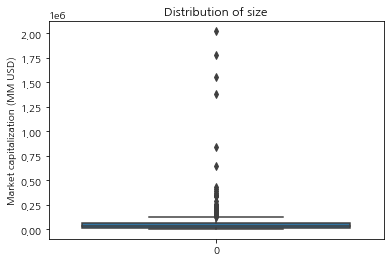

In [ ]:
size_data = data_fundamental[data_fundamental['Year'] == 2020].set_index('Security Name')['Market capitalization']
size_data = pd.to_numeric(size_data.str.strip().str.replace(',',''))

size_data = size_data[size_data.index.isin(data_return.columns)] # remove items filtered out during preprocessing
size_data.dropna(inplace=True) # drop missing items

sns.boxplot(data=size_data)
plt.title('Distribution of size')
plt.ylabel('Market capitalization (MM USD)')
plt.show()

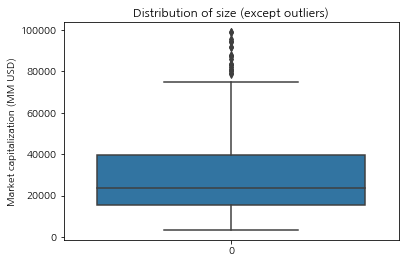

In [ ]:
sns.boxplot(data=size_data[size_data <= 100000])
plt.title('Distribution of size (except outliers)')
plt.ylabel('Market capitalization (MM USD)')
plt.show()

Does size premium exist?
* According to Fama-French(1992), size factor has shown positive relation to stock return in test period (1963-1990)
* Expected return on asset $R_a$ is defined as:
$$R_a = R_f + \beta_{MRP} \text{Market risk premium} + \beta_{SMB} \text{Small minus Big} + \beta_{HML} \text{High minus Low} + \beta_0$$
* Here we replicate the model and check if size premium, SMB factor, still holds for the given period (2015-2020)

Does company size affect degree of return?
* Divided companies into 3 groups by the size of market capitalization
* Took the smallest and largest group to compare monthly returns

In [ ]:
# divide into 3 groups using percenetile
size_bins = np.percentile(size_data, [0, 25, 75, 100])
size_group = pd.cut(size_data, size_bins, include_lowest=True)
size_categories = size_group.values.unique()

smallest_group = size_group[size_group == size_categories[0]].index
largest_group = size_group[size_group == size_categories[-1]].index

print('Count of data by category')
size_group.value_counts()

Count of data by category


(16880.5, 60956.25]      212
(60956.25, 2022547.0]    106
(3471.999, 16880.5]      106
Name: Market capitalization, dtype: int64

Conclusion
* Large-cap stocks tend to yield higher return with smaller variance
* However, we cannot be so certain about it in t-stat-like point of view
* Variance overwhelms corresponding mean, which means it's weak predictor

* If we assume that we have funded by risk-averse investors, market-value weighting would be a reasonable choice


Average monthly difference between groups:
Smallest     0.0004
Largest      0.0006
Difference   0.0002
dtype: float64
Standard deviation:
Smallest     0.0023
Largest      0.0020
Difference   0.0007
dtype: float64


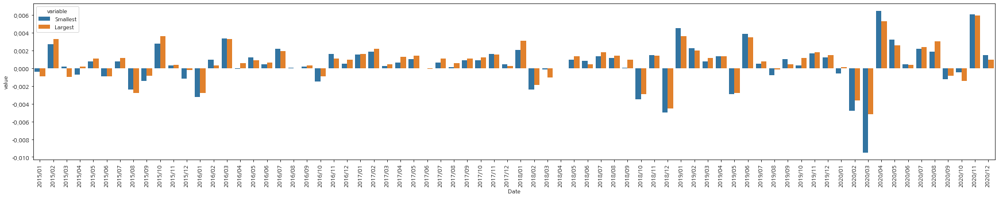

In [ ]:
# stock returns data
data = data_return.copy()

# Reduce to monthly average returns
monthly_return = data.resample('1M').mean()
monthly_return.index = monthly_return.index.strftime('%Y/%m')

# take smallest and largest group and make comparison
smallest_mean = monthly_return.loc[:, list(smallest_group)].mean(axis=1)
largest_mean = monthly_return.loc[:, list(largest_group)].mean(axis=1)
monthly_comparison = pd.concat([smallest_mean, largest_mean], axis=1, keys=['Smallest', 'Largest'])
monthly_comparison['Difference'] = monthly_comparison['Largest'] - monthly_comparison['Smallest']
print('Average monthly difference between groups:')
print(monthly_comparison.mean(axis=0))
print('Standard deviation:')
print(monthly_comparison.std(axis=0))

# Unpivot data to draw barchart
chart_data = monthly_comparison.reset_index().melt(id_vars=['Date'], value_vars=['Smallest', 'Largest'])

fig = plt.figure(figsize=(30, 5))
sns.barplot(data=chart_data, hue='variable', x='Date', y='value')
plt.xticks(rotation=90)
plt.show()

What if we were funded by risk-seeking investors?
* Assuming we believe stock returns follow approximately normal and are independent each other,
* Can test if selected groups are drawn from populations with different variance
 + $H_0: \sigma_{large}^2 = \sigma_{small}^2$
 + $H_1: \sigma_{large}^2 < \sigma_{small}^2$
* If $H_0$ is rejected, we might choose to take more risk by selecting 1-to-1 weighting

### Question 2

Download all financial statement components for companies in your portfolio universe. Can you group them by PCA of FA-like technical approaches? You must find at least 1 common factors across the market, 3 factors that each of which represent an industry. If possible, name each factor and compare it with Fama-French 3-factor or 5-factor models. Your FA-like analysis does not have to be a single layer, i.e. you can do at least two distinctive FA-like data re-shaping w/ multiple naming.

For this purpose, we use year 2020 data only, because we have extracted securities included in S&P500 as of the end of 2020.

In [ ]:
data = data_fundamental_reselect.loc[2020].copy()
data

,,Revenue,Cost of Revenue,Gross Profit,Operating Expenses,Operating Income (Loss) (+),Operating Income (Loss) (-),NonOperating (Income) Loss (+),NonOperating (Income) Loss (-),Abnormal Losses (Gains) (+),Abnormal Losses (Gains) (-),...,Cash From (Repayment) Debt (-),Cash (Repurchase) of Equity (+),Cash (Repurchase) of Equity (-),Cash from Financing Activities (+),Cash from Financing Activities (-),Net Changes in Cash (+),Net Changes in Cash (-),Cash Paid for Taxes (+),Cash Paid for Taxes (-),Cash Paid for Interest
GICS Sector,Security Name,,,,,,,,,,,,,,,,,,,,,
Health Care,A,-0.4394,-0.4759,-0.2218,0.0180,-0.2575,0.0000,-2.2248,0.0000,0.2184,0.0000,...,0.7927,0.0000,0.0768,0.0000,0.1459,-0.7413,0.0000,0.3984,0.0000,-0.4970
Industrials,AAL,0.5027,0.0000,0.0000,1.3826,0.0000,-1.7792,1.2183,0.0000,0.0000,-1.1375,...,0.0000,1.8769,0.0000,1.5422,0.0000,-0.4034,0.0000,-1.9293,0.0000,1.1592
Consumer Discretionary,AAP,0.0710,0.0740,0.1322,0.3785,-0.5054,0.0000,-0.2358,0.0000,-0.1330,0.0000,...,0.0000,0.0000,-0.0047,0.0000,0.7740,0.3343,0.0000,-0.1156,0.0000,-0.9681
Information Technology,AAPL,2.7120,2.3878,2.5698,1.5280,3.2104,0.0000,0.0000,-0.9902,0.0000,0.0355,...,0.0000,0.0000,-3.1252,0.0000,-3.1322,0.0000,-2.2328,2.2564,0.0000,1.8998
Health Care,ABBV,1.2797,0.6928,1.6472,1.0773,2.0375,0.0000,2.4854,0.0000,2.1857,0.0000,...,-1.2928,0.0000,-0.3147,0.0000,-1.7507,0.0000,-2.8481,1.2700,0.0000,1.8124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Industrials,XYL,-0.5120,-0.3422,-0.5608,-0.1317,-0.8485,0.0000,-0.3520,0.0000,0.1084,0.0000,...,0.0000,0.0000,1.5031,-0.1106,0.0000,0.8940,0.0000,-0.8375,0.0000,-0.4451
Consumer Discretionary,YUM,-0.3939,-0.8207,0.0715,0.1670,0.1556,0.0000,0.7476,0.0000,0.3323,0.0000,...,0.0000,0.0000,0.4099,0.0000,0.1261,0.0666,0.0000,0.3439,0.0000,0.7263
Health Care,ZBH,-0.2200,-0.6029,0.2084,0.4176,-0.3541,0.0000,0.1579,0.0000,1.0334,0.0000,...,-0.0880,0.3621,0.0000,0.0000,0.5084,-0.1146,0.0000,-0.1105,0.0000,0.1434


Check Factor Analysis prerequisites: \\

Henze-Zirkler multivariate normality test
* Factor Analysis requires multivariate nomality assumption (because we estimate X with X)
* H0: Test statistic is approximately log-normally distributed
* H1: not H0

Bartlett's test for sphericity
* stands when the errors are assumed to be not only conditionally homoskedastic, but also conditionally uncorrelated
* in other words: when variances of the differences between all combinations of related groups are equal
* p-value should be less than 0.05 to be statistically significant

Kaiser-Meyer-Olkin test for suitability of factor analysis
* estimate ratio of variances between observed variables
* in line with chi square test for homogeneity (goodness of fit)
* the higher test statistic, the more likely common latent factor exist

All passed, which means Factor Analysis can be of use for this dataset and will have some explanatory power.

In [ ]:
import pingouin as pg
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity, calculate_kmo

data = data_fundamental_reselect.loc[2020].copy()

# HZ normality test
print('H-Z normality: ', pg.multivariate_normality(data, alpha=.05))

# Bartlett's sphericity test
chi_square_value, p_value = calculate_bartlett_sphericity(data)
print("Bartlett's sphericity: ", chi_square_value, p_value)

# KMO test for suitability of factor analysis
kmo_all, kmo_model = calculate_kmo(data)
print('KMO test: ', kmo_model)

H-Z normality:  HZResults(hz=1.0257399516268588, pval=0.0, normal=False)
Bartlett's sphericity:  15935.718020409673 0.0
KMO test:  0.9176525317182657


/opt/conda/lib/python3.8/site-packages/factor_analyzer/utils.py:249: UserWarning:

The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.



In [ ]:
from sklearn.decomposition import PCA

data = data_fundamental_reselect.loc[2020].copy()

# determined by explonatory factor analysis below
num_of_component = 10

pca_fundamental = PCA(
    n_components=num_of_component,
    svd_solver='auto', # {‘auto’, ‘full’, ‘arpack’, ‘randomized’}
    random_state=random_state,
).fit(data)

Loading matrix from PCA shows each of p variable's contribution to abstract or hidden attribute represented by principal components. \\

With it, one can explain how much each variable (column) is affected by a specific principal component. \\
(Change of basis perstpetive) \\

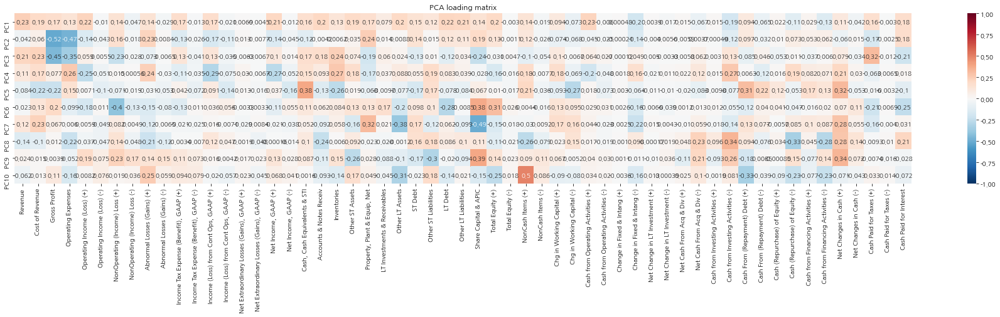

In [ ]:
# PCA score and loading matrix
pcs = [f'PC{i+1}' for i in range(len(accounts_reselected))]
pca_fundamental_score = pd.DataFrame(
    pca_fundamental.transform(data),
    index=data.index,
    columns=pcs[:num_of_component]
)

pca_fundamental_loading = pd.DataFrame(
    pca_fundamental.components_,
    index=pca_fundamental_score.columns,
    columns=accounts_reselected
)

fig = plt.figure(figsize=(32,5))
sns.heatmap(pca_fundamental_loading, cmap='RdBu_r', annot=True, vmin=-1, vmax=1, ax=plt.gca())
plt.title('PCA loading matrix')
plt.show()

Choosing principal components

* PCA sorts principal component by the size of eigenvalues
* Because Eigenvalue reflects the size of variance contribution
* Keeping only top N principal components reduces computational cost - that is, higher efficiency can be achieved
* As a result, it is expected that there will be information loss - it's one way of regularization however

What should be the order(K) of eigenvestors for PCR model?

* As shown above, components up to PC5 contain "joint movement" infromation such as macro-economic or industry effect
* However, here **we choose 3 principal components** which explains about 65% of varaince in the dataset
* Our goal is to to capture variance which explains the dependent variable V1
* Meanwhile, stock return cannot be explained only with the other stock's return: there will be OVB(Omitted variable bias) in the regression if we try to choose too many factors from PCA

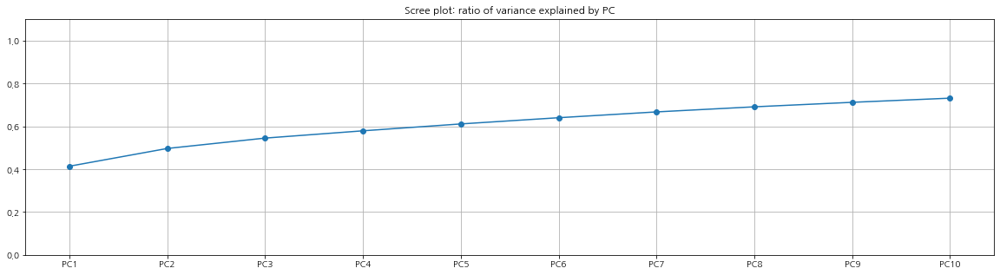

In [ ]:
# (cumulative) scree plot

fig = plt.figure(figsize=(20,5))

plt.plot(pca_fundamental_score.columns, pca_fundamental.explained_variance_ratio_.cumsum(), '-o')
plt.title('Scree plot: ratio of variance explained by PC')
plt.grid(True)
plt.ylim(0,1.1)

plt.show()

PCA doesn't seem to have enough power to distinguish industry group

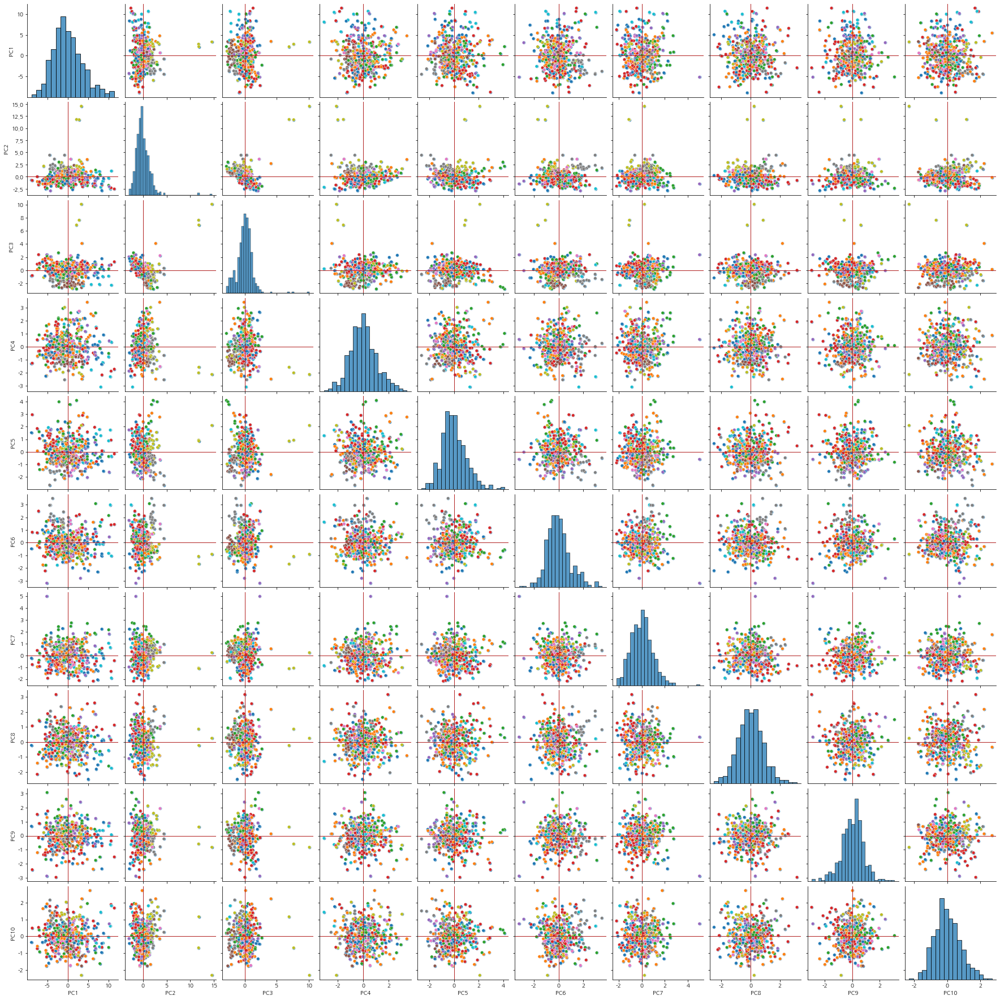

In [ ]:
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# color_label = le.fit_transform(pca_fundamental_score['GICS Sector'])
# color_map = sns.color_palette("muted", len(pca_fundamental_score['GICS Sector']))
# print(np.array([(idx, cls) for idx, cls in enumerate(le.classes_)]))

data = pca_fundamental_score.copy()
# restore sector flags to see if groups can be identified by PCs
# data['GICS Sector'] = data.index.map(security_industry_map)

grid = sns.pairplot(data)
grid.map_offdiag(add_zeroline)
grid.map_offdiag(time_heatmap, hue=data.index.get_level_values(0), palette=industry_colormap)
plt.show()

Both methods return similar results when number of component is set to 1, though the result starts to diverge as the number of components gets larger

We chose FactorAanlyzer because it
* provides higher degree of freedom: that is, more parameters customizable such as rotation, method, etc. and
* gives better classification result by eyeball test, even with the identical settings

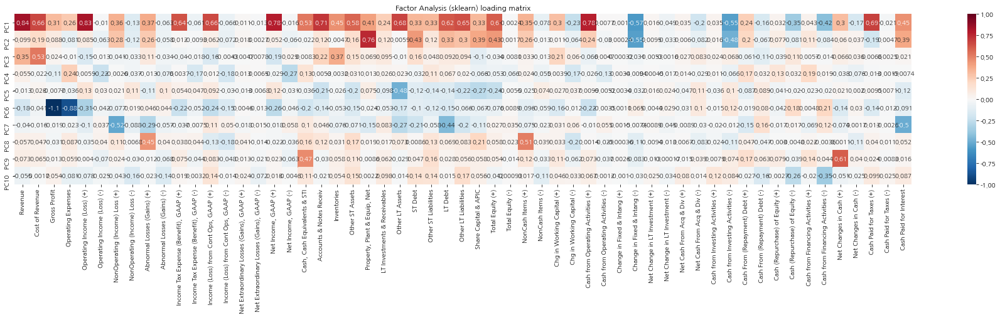

In [ ]:
from sklearn.decomposition import FactorAnalysis
from factor_analyzer import FactorAnalyzer

data = data_fundamental_reselect.loc[2020].copy()

fa_fundamental_sklearn = FactorAnalysis(
    n_components=num_of_component,
    svd_method='randomized', # {‘lapack’, ‘randomized’}
    rotation='varimax', # {None, ‘varimax’, ‘quartimax’}
    random_state=random_state,
).fit(data)

fa_fundamental_sklearn_loading = pd.DataFrame(
    fa_fundamental_sklearn.components_,
    columns=data.columns,
    index=pcs[:num_of_component]
)
fa_fundamental_sklearn_score = pd.DataFrame(
    fa_fundamental_sklearn.transform(data),
    columns=pcs[:num_of_component],
    index=data.index
)

fig = plt.figure(figsize=(32,5))
sns.heatmap(fa_fundamental_sklearn_loading, cmap='RdBu_r', annot=True, vmin=-1, vmax=1, ax=plt.gca())
plt.title('Factor Analysis (sklearn) loading matrix')
plt.show()

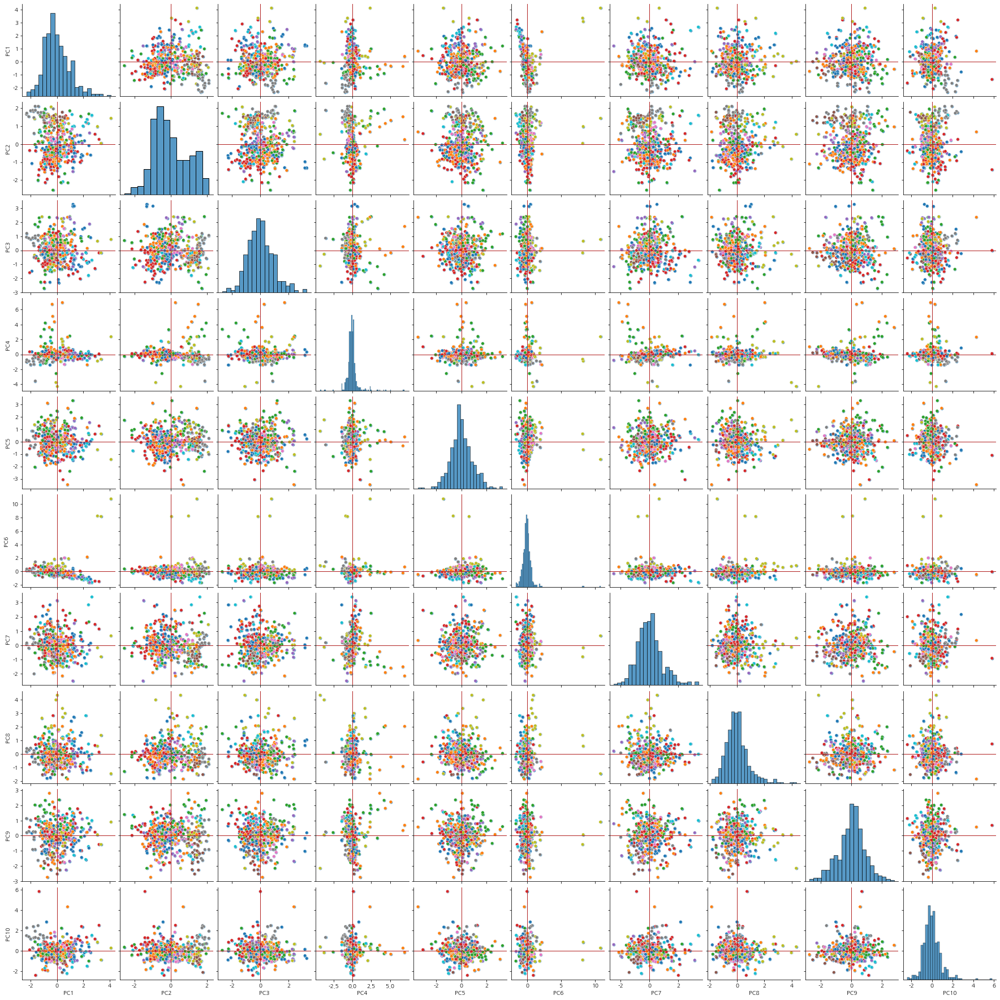

In [ ]:
data = fa_fundamental_sklearn_score.copy()

# data['GICS Sector'] = data.index.map(security_industry_map)

grid = sns.pairplot(data)
grid.map_offdiag(add_zeroline)
grid.map_offdiag(time_heatmap, hue=data.index.get_level_values(0), palette=industry_colormap)
plt.show()

Now with the loading matrix, we can identify common factors:

**Common macro-level factor**: \\
Factor #1 does seems to be positively related to balance sheet accounts. In other words, it have something to do with the absolute size of the company. In this regard, we may name it as "size factor".

**Industry-specific factors**: \\
Unlike Factor #1,

PC1, PC2 and below seem to have a different impact on each stocks and those can be interpreted as **industry-level factors**.

Factor Analysis: which rotation to choose? \\

* Varimax Method. An orthogonal rotation method that **minimizes the number of variables** that have high loadings on each factor. This method simplifies the interpretation of the factors.

* Direct Oblimin Method. A method for oblique (nonorthogonal) rotation. When delta equals 0 (the default), solutions are most oblique. As delta becomes more negative, the factors become less oblique. To override the default delta of 0, enter a number less than or equal to 0.8.

* Quartimax Method. A rotation method that **minimizes the number of factors** needed to explain each variable. This method simplifies the interpretation of the observed variables.

* Equamax Method. A rotation method that is a **combination of the varimax method, which simplifies the factors, and the quartimax method, which simplifies the variables.** The number of variables that load highly on a factor and the number of factors needed to explain a variable are minimized.

* Promax Rotation. An oblique rotation, which **allows factors to be correlated.** This rotation can be calculated more quickly than a direct oblimin rotation, so it is useful for large datasets.

https://www.ibm.com/docs/en/spss-statistics/25.0.0?topic=analysis-factor-rotation


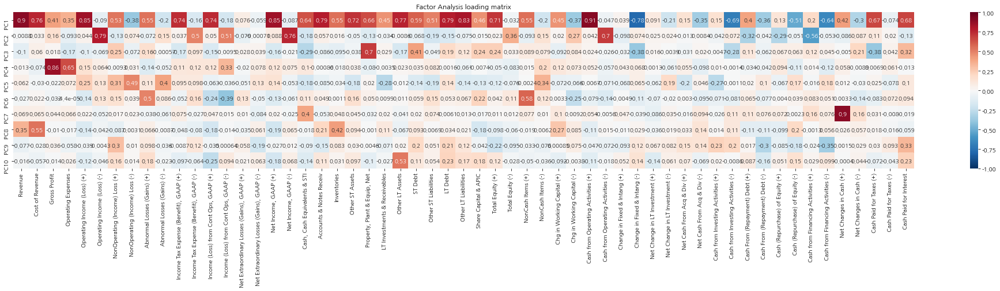

In [ ]:
data = data_fundamental_reselect.loc[2020].copy()

fa_fundamental = FactorAnalyzer(
    n_factors=num_of_component,
    # Why quartimax yields best classification result?
    rotation='quartimax', # None / varimax (orthogonal rotation) / promax (oblique rotation) / oblimin (oblique rotation) / oblimax (orthogonal rotation) / quartimin (oblique rotation) / quartimax (orthogonal rotation) / equamax (orthogonal rotation)
    method='ml', # {'minres', 'ml', 'principal'}
    is_corr_matrix=False, #  true if the data is the correlation matrix
).fit(data)

fa_fundamental_loading = pd.DataFrame(
    fa_fundamental.loadings_.T,
    columns=data.columns,
    index=pcs[:num_of_component]
)
fa_fundamental_score = pd.DataFrame(
    fa_fundamental.transform(data),
    columns=pcs[:num_of_component],
    index=data.index
)

fig = plt.figure(figsize=(35,5))
sns.heatmap(fa_fundamental_loading, cmap='RdBu_r', annot=True, vmin=-1, vmax=1, ax=plt.gca())
plt.title('Factor Analysis loading matrix')
plt.show()

How to interprete the selected industry-specific Factors?

**PC3**: companies invested into substantial tangible assets backed by debt
* strong positive correlation (>.5) with [Property, Plant & Equip, Net]
* moderate positive correlation (>.3) with [Short term Debt]
* moderate negative correlation (>.3) with [Change in Fixed & Intang (-)], [Cash from Investing Activities (-)], [Cash Paid for Taxes (+)]

**PC4**: companies making substantial gross profit but operating loss due to high expenses
* strong positive correlation (>.5) with [Gross Profit], [Operating Expenses]
* moderate positive correlation (>.3) with [Income (Loss) from Cont Ops (-)]

**PC7**: companies with huge volume but thin gross margin
* strong positive correlation (>.5) with [Cost of Revenue]
* moderate positive correlation (>.3) with [Revenue], [Inventories]
* weak positive correlation (>.2) with [Chg in Working Capital (+)]

Therefore, infered from the properties, we can name these for:
* PC3: Tangible asset based
* PC4: Reduced margin due to high expense
* PC7: High volume, low gross margin

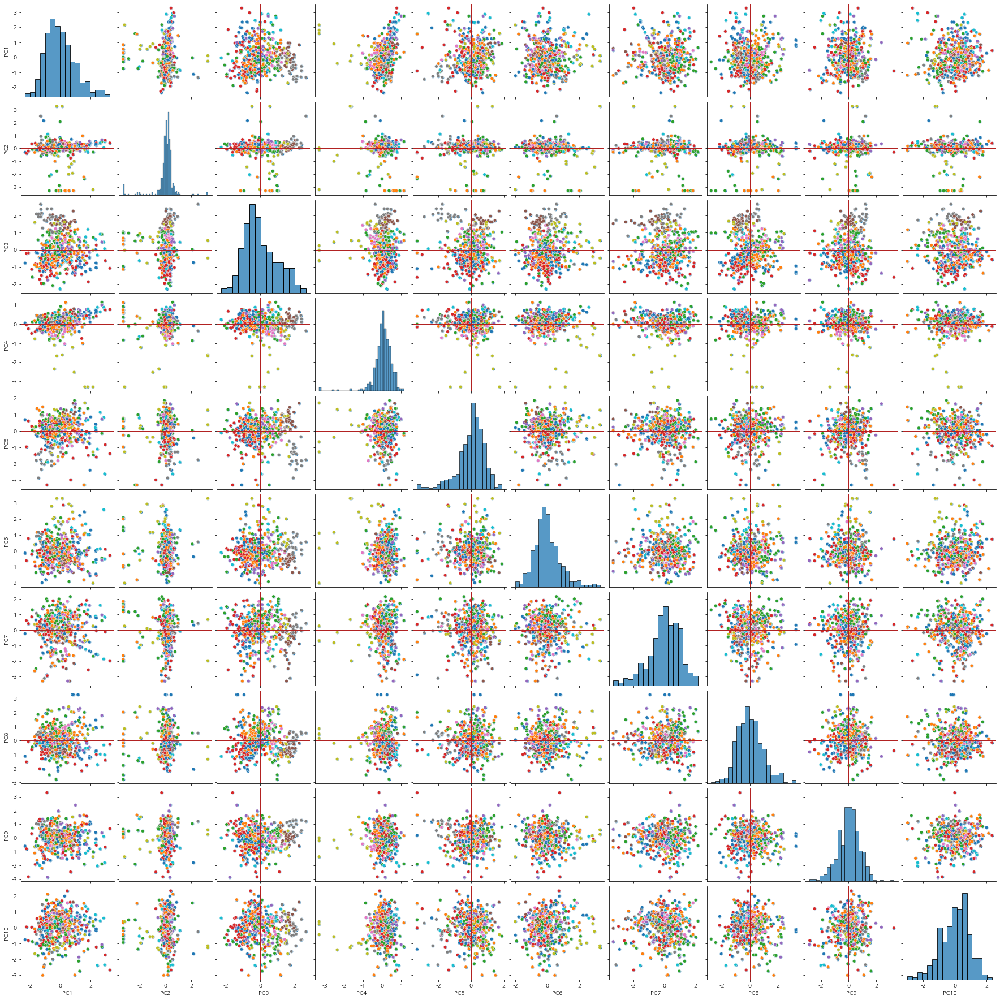

In [ ]:
data = fa_fundamental_score.copy()

# set bound limit to surpress outliers (clarify group differences)
outlier_bound = 3.29
data[data > outlier_bound] = outlier_bound
data[data < -outlier_bound] = -outlier_bound

# data['GICS Sector'] = data.index.map(security_industry_map)
gics_sector = data.index.get_level_values(level=0)

grid = sns.pairplot(data)
grid.map_offdiag(add_zeroline)
grid.map_offdiag(time_heatmap, hue=gics_sector, palette=industry_colormap)
plt.show()

factor_1 = 'PC3'
factor_2 = 'PC4'
factor_3 = 'PC7'

factor_name_1 = 'Tangible asset based'
factor_name_2 = 'Reduced margin due to high expense'
factor_name_3 = 'High volume, low gross margin'

To figure out how many factors we would need, we can look at eigenvalues, which is a measure of how much of the variance of the variables does a factor explain. \\

* An eigenvalue of more than one means that the factor explains more variance than a unique variable

* big dropoff in eigenvalue after the 3rd factor

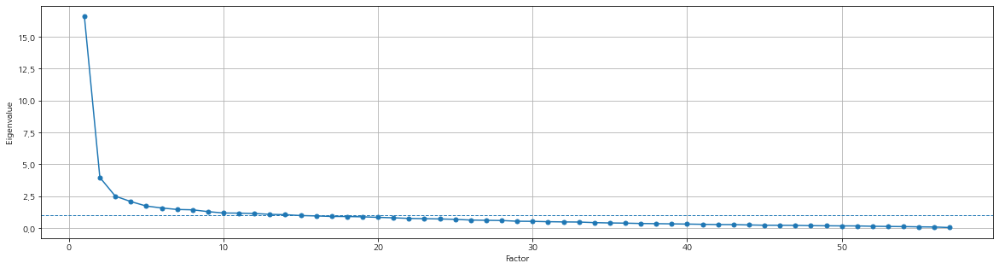

In [ ]:
# https://towardsdatascience.com/factor-analysis-a-complete-tutorial-1b7621890e42
fa_eigenvalues = fa_fundamental.get_eigenvalues()[0]

fig = plt.figure(figsize=(20,5))

plt.plot(range(1, len(fa_eigenvalues)+1), fa_eigenvalues, marker='o', markersize=5)
ax = plt.gca()
ax.axhline(y=1, lw=1, ls='--')
plt.xlabel('Factor')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

#### GMM Approach

GMM
* Multi-layered factor analysis (without adding arbitraty non-linearity such as activation function) cannot catch non-linearity
* Assign probabilities for each group, assuming each group represents a hidden (latent) variable
* Tries to find combination of Gaussianity from non-Gaussian data

In [ ]:
from sklearn.mixture import GaussianMixture

# select industry factors
factor_1 = 'PC3'
factor_2 = 'PC7'
factor_3 = 'PC10'

data = fa_fundamental_score.copy()
data = data[[factor_1, factor_2, factor_3]]

# eliminating outlier: keep 99% confidence interval only
(that is, z-score is higher than 3.29 or lower than -3.29)
outlier_bound = 3.29
data[data > outlier_bound] = outlier_bound
data[data < -outlier_bound] = -outlier_bound

gmm_fundamental = GaussianMixture(
    n_components=len(industries_exc_financial),
    covariance_type='full', # {‘full’, ‘tied’, ‘diag’, ‘spherical’}
    weights_init=None,
    random_state=random_state,
).fit(data)

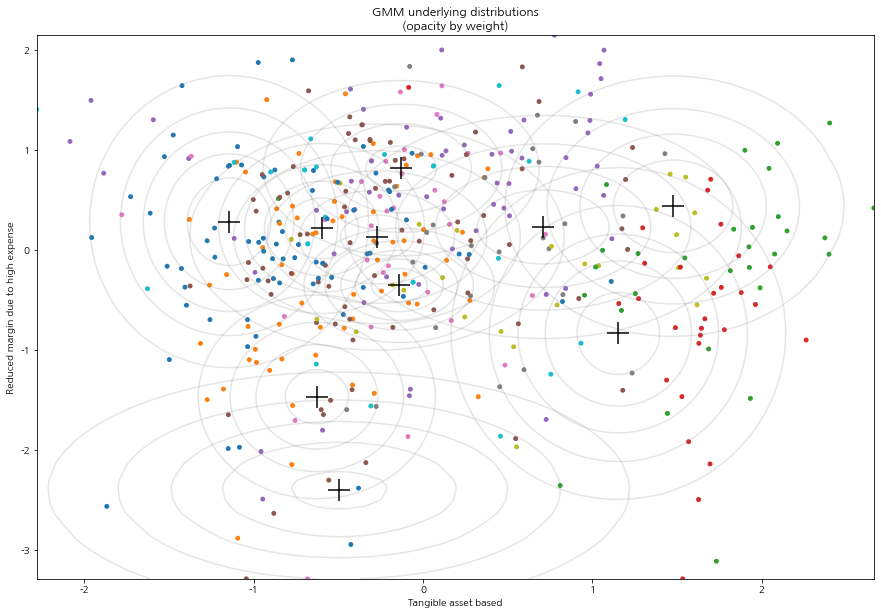

In [ ]:
# draw contour chart to show multi-variate Gaussian distribution
# https://towardsdatascience.com/gaussian-mixture-models-gmm-6e95cbc38e6e

from scipy.stats import multivariate_normal

x,y = np.meshgrid(np.sort(data[factor_1]), np.sort(data[factor_2]))
xy = np.array([x.flatten(), y.flatten()]).T

fig = plt.figure(figsize=(15,10))

mu = gmm_fundamental.means_
cov = gmm_fundamental.covariances_
weight = gmm_fundamental.weights_

# sorted by gmm label generated by model
for idx, (m, c) in enumerate(zip(mu[:,[0,1]], cov[:,[0,1],[0,1]])):
    xi = np.sort(data[factor_1])
    yi = np.sort(data[factor_2])

    multi_normal = multivariate_normal(mean=m, cov=c)
    zi = multi_normal.pdf(xy).reshape(len(x), len(x))

    plt.contour(xi, yi, zi, levels=5, colors='grey', alpha=0.2)
    # ctrf = plt.contourf(xi, yi, zi, levels=5, cmap='binary', extend='both', alpha=0.5)
    plt.scatter(m[0], m[1], c='k', marker='+', zorder=10, s=500)

plt.xlabel(factor_name_1)
plt.ylabel(factor_name_2)
plt.title('GMM underlying distributions\n(opacity by weight)')

industry_actual_color = data.index.get_level_values(1).map(security_colormap)
plt.scatter(data[factor_1], data[factor_2], s=15, c=industry_actual_color)

# plt.colorbar(ctrf)
plt.show()

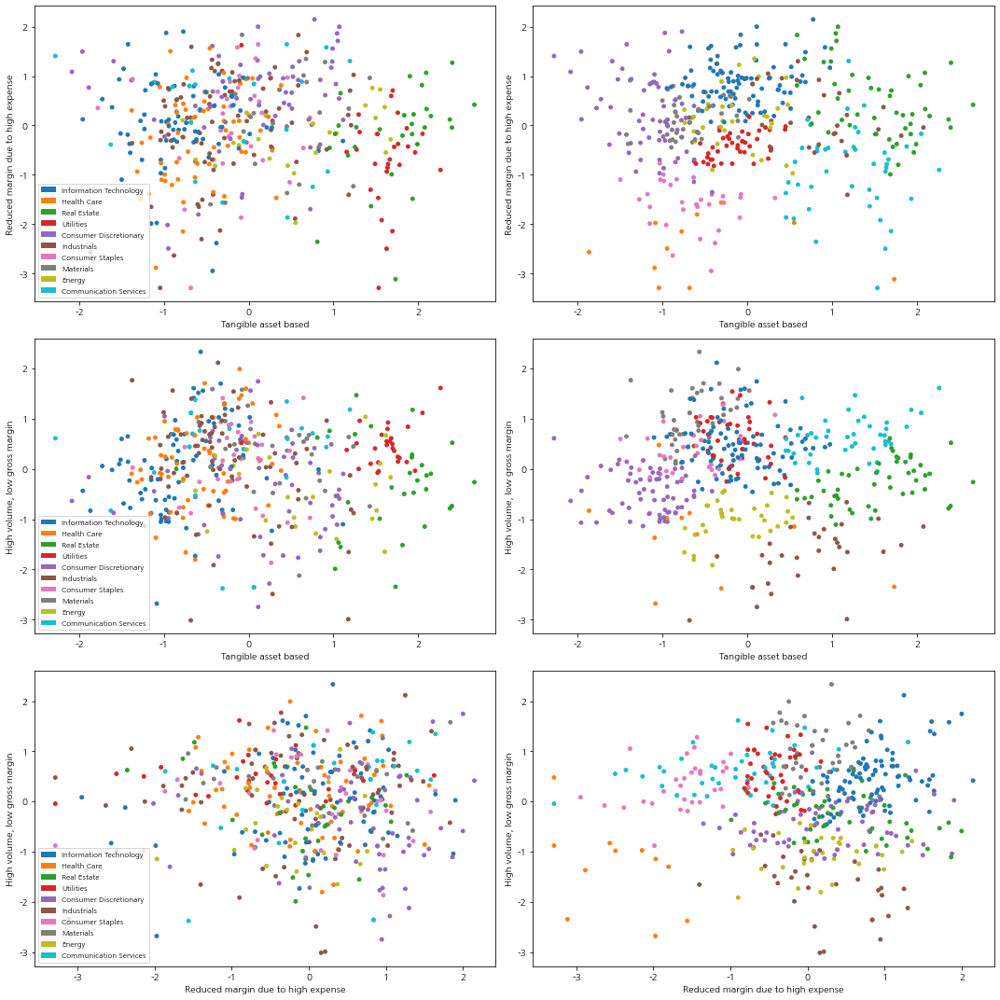

In [ ]:
from matplotlib.patches import Patch

# produce a legend with the unique colors from the scatter
legend_elements = [
    Patch(facecolor=col, label=idu) for idu, col in zip(industries_exc_financial, industry_colors)
]

gmm_labels = gmm_fundamental.predict(data)
gmm_probability = gmm_fundamental.predict_proba(data)
gmm_label_color = [industry_colors[idx] for idx in gmm_labels]

security_color = data.index.get_level_values(1).map(security_colormap)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

axes[0,0].scatter(data[factor_1], data[factor_2], s=15, c=security_color)
axes[0,1].scatter(data[factor_1], data[factor_2], s=15, c=gmm_label_color)
axes[0,0].set_xlabel(factor_name_1)
axes[0,1].set_xlabel(factor_name_1)
axes[0,0].set_ylabel(factor_name_2)
axes[0,1].set_ylabel(factor_name_2)
axes[0,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[1,0].scatter(data[factor_1], data[factor_3], s=15, c=security_color)
axes[1,1].scatter(data[factor_1], data[factor_3], s=15, c=gmm_label_color)
axes[1,0].set_xlabel(factor_name_1)
axes[1,1].set_xlabel(factor_name_1)
axes[1,0].set_ylabel(factor_name_3)
axes[1,1].set_ylabel(factor_name_3)
axes[1,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[2,0].scatter(data[factor_2], data[factor_3], s=15, c=security_color)
axes[2,1].scatter(data[factor_2], data[factor_3], s=15, c=gmm_label_color)
axes[2,0].set_xlabel(factor_name_2)
axes[2,1].set_xlabel(factor_name_2)
axes[2,0].set_ylabel(factor_name_3)
axes[2,1].set_ylabel(factor_name_3)
axes[2,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

plt.tight_layout()
plt.show()

Fama-French 3-factor model
* market beta
* size factor
* factor

### Question 3

Based on your factors in 2), form industry-wide portfolios among S&P 500 companies, and match your calculation with real company business.

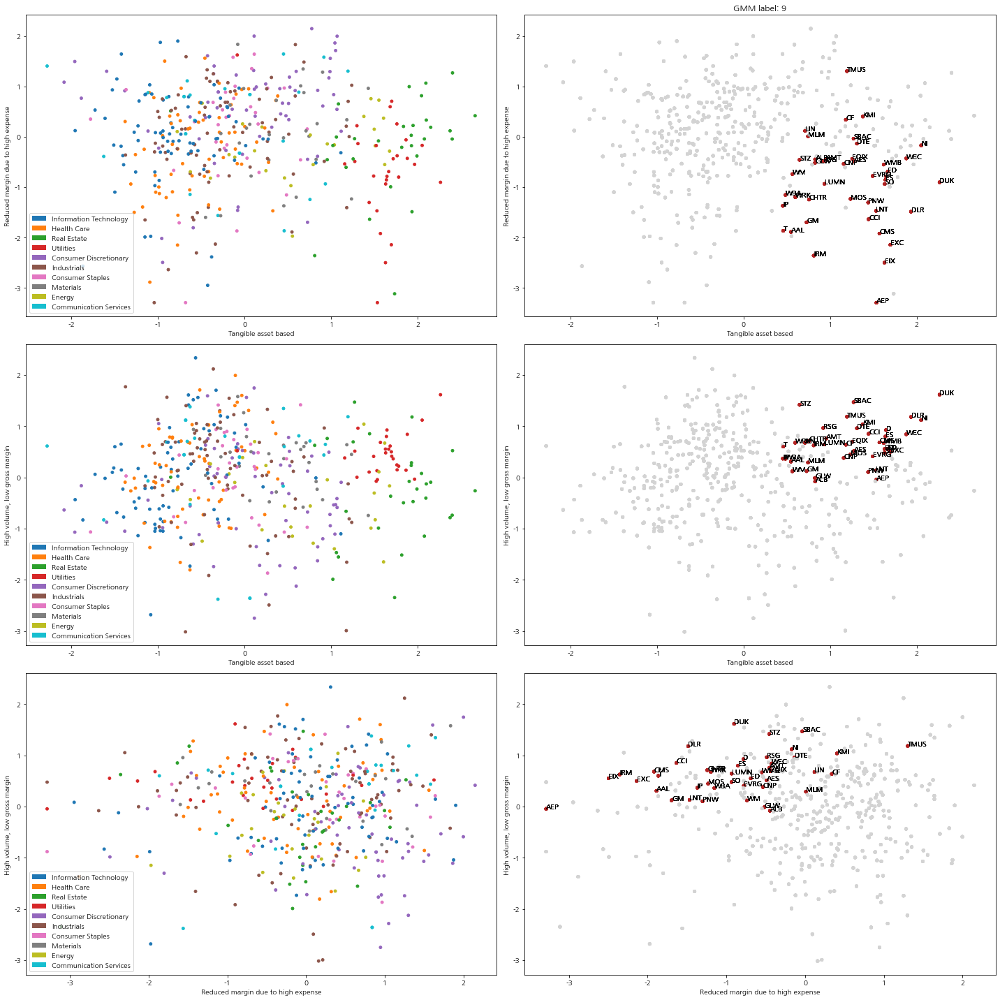

In [ ]:
# match color mapping with eyeball test, label by label
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 20))

gmm_label = 9

axes[0,0].scatter(data[factor_1], data[factor_2], s=15, c=security_color)
axes[0,0].set_xlabel(factor_name_1)
axes[0,0].set_ylabel(factor_name_2)
axes[0,0].legend(handles=legend_elements, prop={'size': 10}, loc='lower left')

for i in range(len(industries_exc_financial)):
    axes[0,1].scatter(data[factor_1], data[factor_2], s=15, c=['firebrick' if l == gmm_label else 'lightgrey' for l in gmm_labels])
    axes[0,1].set_xlabel(factor_name_1)
    axes[0,1].set_ylabel(factor_name_2)
    axes[0,1].set_title(f'GMM label: {gmm_label}')
    for idx, txt in enumerate([sec if l == gmm_label else None for l, sec in zip(gmm_labels, data.index.get_level_values(1))]):
        axes[0,1].annotate(txt, (data[factor_1][idx], data[factor_2][idx]))

axes[1,0].scatter(data[factor_1], data[factor_3], s=15, c=security_color)
axes[1,0].set_xlabel(factor_name_1)
axes[1,0].set_ylabel(factor_name_3)
axes[1,0].legend(handles=legend_elements, prop={'size': 10}, loc='lower left')

for i in range(len(industries_exc_financial)):
    axes[1,1].scatter(data[factor_1], data[factor_3], s=15, c=['firebrick' if l == gmm_label else 'lightgrey' for l in gmm_labels])
    axes[1,1].set_xlabel(factor_name_1)
    axes[1,1].set_ylabel(factor_name_3)
    for idx, txt in enumerate([sec if l == gmm_label else None for l, sec in zip(gmm_labels, data.index.get_level_values(1))]):
        axes[1,1].annotate(txt, (data[factor_1][idx], data[factor_3][idx]))

axes[2,0].scatter(data[factor_2], data[factor_3], s=15, c=security_color)
axes[2,0].set_xlabel(factor_name_2)
axes[2,0].set_ylabel(factor_name_3)
axes[2,0].legend(handles=legend_elements, prop={'size': 10}, loc='lower left')

for i in range(len(industries_exc_financial)):
    axes[2,1].scatter(data[factor_2], data[factor_3], s=15, c=['firebrick' if l == gmm_label else 'lightgrey' for l in gmm_labels])
    axes[2,1].set_xlabel(factor_name_2)
    axes[2,1].set_ylabel(factor_name_3)
    for idx, txt in enumerate([sec if l == gmm_label else None for l, sec in zip(gmm_labels, data.index.get_level_values(1))]):
        axes[2,1].annotate(txt, (data[factor_2][idx], data[factor_3][idx]))

plt.tight_layout()
plt.show()

In [ ]:
# match color mapping based on the most frequent appearance for prediction label

# data['GICS Sector'] = data.index.map(security_industry_map)

gmm_industry_map = dict()

industry_predictions = []

for i in range(len(set(gmm_labels))):
    data_predicted = data[gmm_labels == i].index.get_level_values(level=0).value_counts(sort=True, ascending=False)
    industry_predictions.append(data_predicted)
    print(f'GMM label {i}:\n', data_predicted[:2])
    gmm_industry_map[i] = data_predicted.index[0]

industry_not_identified = set(industries_exc_financial) - set(gmm_industry_map.values())
if industry_not_identified:
    print('\nIndustry failed to identify: ', industry_not_identified)

gmm_label_to_industry = [gmm_industry_map[idx] for idx in gmm_labels]
industry_estimated_color = [industry_colormap[industry_colorcode[idu]] for idu in gmm_label_to_industry]
data['GICS Sector Predicted'] = gmm_label_to_industry

# for future use
data_fundamental_predicted = data_fundamental_reselect.copy()
data_fundamental_predicted['GICS Sector Predicted'] = data_fundamental_predicted.index.get_level_values(level=2).map(data['GICS Sector Predicted'].reset_index().set_index('Security Name')['GICS Sector Predicted'])
data_fundamental_predicted = data_fundamental_predicted.reset_index().set_index(['Year', 'GICS Sector Predicted', 'Security Name'])
data_fundamental_predicted.drop('GICS Sector', axis=1, inplace=True)

GMM label 0:
 Industrials               22
Consumer Discretionary    18
Name: GICS Sector, dtype: int64
GMM label 1:
 Consumer Discretionary    2
Health Care               2
Name: GICS Sector, dtype: int64
GMM label 2:
 Real Estate    15
Utilities      10
Name: GICS Sector, dtype: int64
GMM label 3:
 Health Care    9
Industrials    8
Name: GICS Sector, dtype: int64
GMM label 4:
 Information Technology    30
Health Care               12
Name: GICS Sector, dtype: int64
GMM label 5:
 Consumer Discretionary    11
Real Estate                7
Name: GICS Sector, dtype: int64
GMM label 6:
 Health Care    12
Industrials     8
Name: GICS Sector, dtype: int64
GMM label 7:
 Information Technology    18
Industrials                9
Name: GICS Sector, dtype: int64
GMM label 8:
 Health Care               9
Consumer Discretionary    6
Name: GICS Sector, dtype: int64
GMM label 9:
 Utilities    17
Materials     7
Name: GICS Sector, dtype: int64

Industry failed to identify:  {'Materials', 'Energy', 'Co

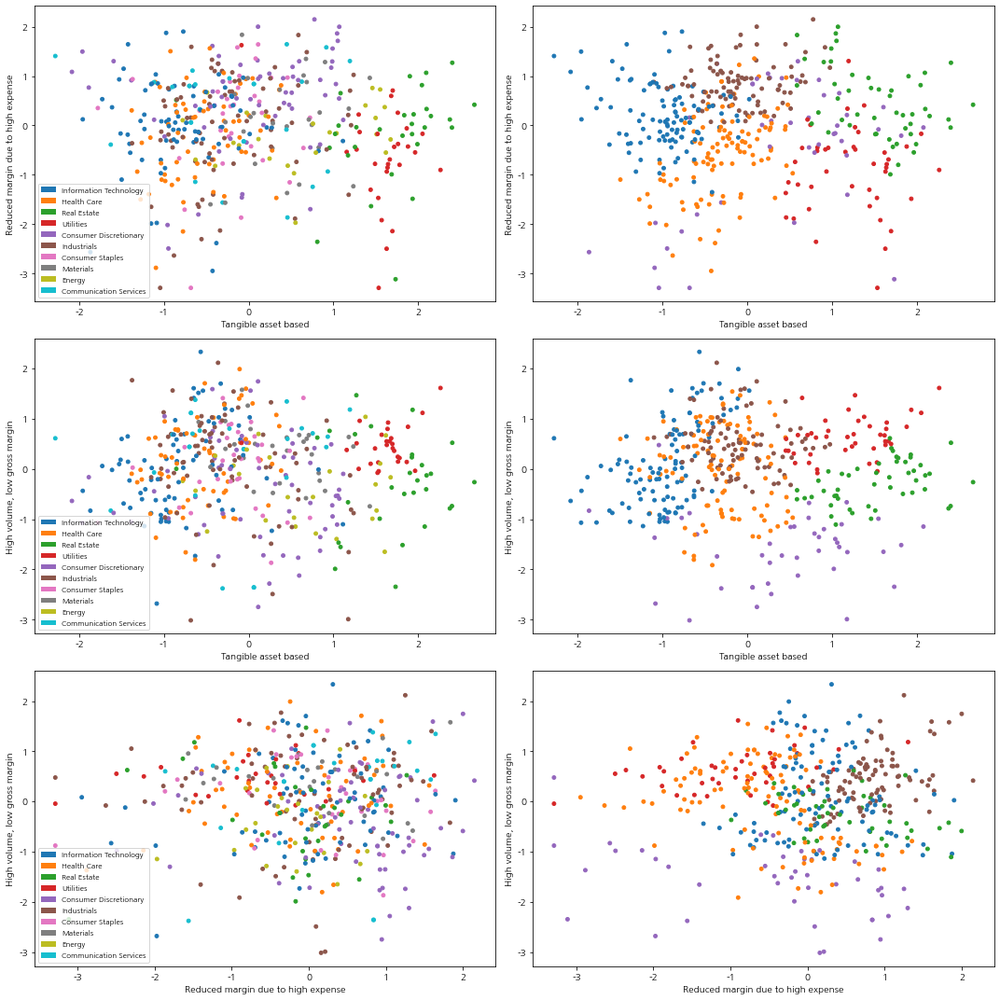

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

axes[0,0].scatter(data[factor_1], data[factor_2], s=15, c=industry_actual_color)
axes[0,1].scatter(data[factor_1], data[factor_2], s=15, c=industry_estimated_color)
axes[0,0].set_xlabel(factor_name_1)
axes[0,1].set_xlabel(factor_name_1)
axes[0,0].set_ylabel(factor_name_2)
axes[0,1].set_ylabel(factor_name_2)
axes[0,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[1,0].scatter(data[factor_1], data[factor_3], s=15, c=industry_actual_color)
axes[1,1].scatter(data[factor_1], data[factor_3], s=15, c=industry_estimated_color)
axes[1,0].set_xlabel(factor_name_1)
axes[1,1].set_xlabel(factor_name_1)
axes[1,0].set_ylabel(factor_name_3)
axes[1,1].set_ylabel(factor_name_3)
axes[1,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[2,0].scatter(data[factor_2], data[factor_3], s=15, c=industry_actual_color)
axes[2,1].scatter(data[factor_2], data[factor_3], s=15, c=industry_estimated_color)
axes[2,0].set_xlabel(factor_name_2)
axes[2,1].set_xlabel(factor_name_2)
axes[2,0].set_ylabel(factor_name_3)
axes[2,1].set_ylabel(factor_name_3)
axes[2,0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

plt.tight_layout()
plt.show()

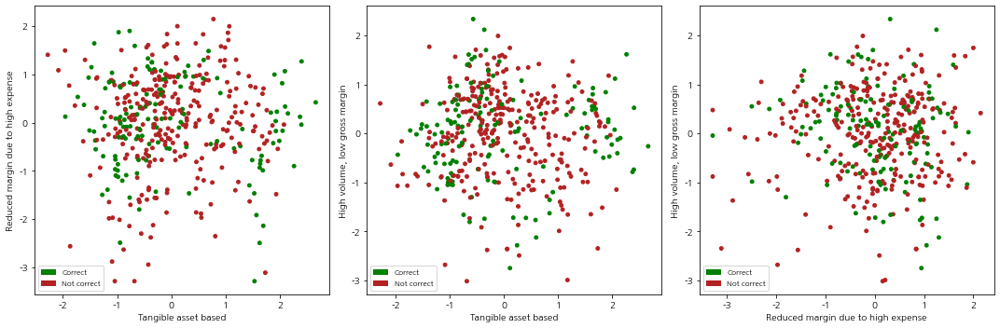

In [ ]:
# match with actual industry
industry_matched = [True if actual == estimated else False for actual, estimated in zip(industry_actual_color, industry_estimated_color)]

legend_elements = [
    Patch(facecolor='green', label='Correct'),
    Patch(facecolor='firebrick', label='Not correct'),
]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

axes[0].scatter(data[factor_1], data[factor_2], s=15, c=['green' if check else 'firebrick' for check in industry_matched])
axes[0].set_xlabel(factor_name_1)
axes[0].set_ylabel(factor_name_2)
axes[0].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[1].scatter(data[factor_1], data[factor_3], s=15, c=['green' if check else 'firebrick' for check in industry_matched])
axes[1].set_xlabel(factor_name_1)
axes[1].set_ylabel(factor_name_3)
axes[1].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

axes[2].scatter(data[factor_2], data[factor_3], s=15, c=['green' if check else 'firebrick' for check in industry_matched])
axes[2].set_xlabel(factor_name_2)
axes[2].set_ylabel(factor_name_3)
axes[2].legend(handles=legend_elements, prop={'size': 8}, loc='lower left')

plt.tight_layout()
plt.show()

In [ ]:
# calculate F1 score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

label_order = list(gmm_industry_map.values())

# weighted average
f1_fundamental_avg = f1_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average='weighted', # {‘micro’, ‘macro’, ‘samples’, ’weighted’, ‘binary’}
    labels=label_order,
)
precision_fundamental_avg = precision_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average='weighted',
    labels=label_order,
)
recall_fundamental_avg = recall_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average='weighted',
    labels=label_order,
)

f1_fundamental_score_avg = pd.DataFrame(
    {
        'F1 score': [f1_fundamental_avg],
        'Precision': [precision_fundamental_avg],
        'Recall': [recall_fundamental_avg]
    },
)
print('F1 score averaged:')
f1_fundamental_score_avg

F1 score averaged:


,F1 score,Precision,Recall
0,0.3723,0.3286,0.4508


In [ ]:
f1_fundamental = f1_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average=None, # class by class
    labels=label_order,
)
precision_fundamental = precision_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average=None,
    labels=label_order,
)
recall_fundamental = recall_score(
    y_true=data.index.get_level_values(0),
    y_pred=data['GICS Sector Predicted'],
    average=None,
    labels=label_order,
)

f1_fundamental_score_byclass = pd.DataFrame(
    {
        'F1 score': f1_fundamental,
        'Precision': precision_fundamental,
        'Recall': recall_fundamental
    },
    index=label_order,
)
print('F1 score by class:')
f1_fundamental_score_byclass

F1 score by class:


,F1 score,Precision,Recall
Industrials,0.2683,0.2418,0.3014
Consumer Discretionary,0.2476,0.3023,0.2097
Real Estate,0.3797,0.3061,0.5000
Health Care,0.3529,0.2804,0.4762
Information Technology,0.5333,0.4486,0.6575
Consumer Discretionary,0.2476,0.3023,0.2097
Health Care,0.3529,0.2804,0.4762
Information Technology,0.5333,0.4486,0.6575
Health Care,0.3529,0.2804,0.4762
Utilities,0.4789,0.3953,0.6071



ROC Curve by class:


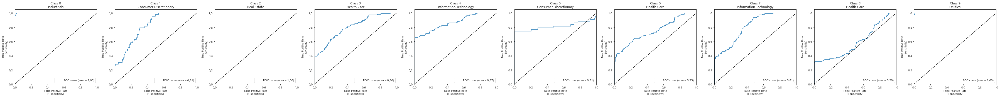

In [ ]:
# plot ROC curve for each class
from sklearn.metrics import roc_curve, auc

fpr, tpr, th, roc_auc = dict(), dict(), dict(), dict()

for i in range(len(gmm_industry_map)):
    fpr[i], tpr[i], thresholds = roc_curve(
        y_true=[1 if l == gmm_industry_map[i] else 0 for l in gmm_label_to_industry], # binary format
        y_score=gmm_probability[:,i]
    )
    roc_auc[i] = auc(fpr[i], tpr[i])
    th[i] = thresholds

plt.figure(figsize=(50, 5))

for idx, i in enumerate(range(len(gmm_industry_map))):

    plt.subplot(1, len(gmm_industry_map), 1+idx)
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate\n(1-specificity)')
    plt.ylabel('True Positive Rate\n(sensitivity)')
    plt.title(f'Class {idx:.0f}\n{gmm_industry_map[i]}')
    plt.legend(loc="lower right")

print('\nROC Curve by class:')
plt.tight_layout()
plt.show()

Grouped securities by industry, based on FA prediction

In [ ]:
securities_industry = data['GICS Sector Predicted'].reset_index().set_index('Security Name')['GICS Sector Predicted'].copy()

industry_portfolio_securities = dict()

for idu in securities_industry.unique():
    industry_securities = data[data['GICS Sector Predicted'] == idu].index.get_level_values(1)
    industry_portfolio_securities[idu] = list(industry_securities)

pd.DataFrame(
    [','.join(industry_portfolio_securities[idu]) for idu in industry_portfolio_securities.keys()],
    index=industry_portfolio_securities.keys(),
    columns=['Securities in sector']
)

,Securities in sector
Health Care,"A,ABBV,AKAM,AMCR,AMGN,ANSS,AVY,BA,BAX,BLL,CAG,CERN,CHD,CNC,COO,COP,CPRT,CTAS,CTSH,CVX,DG,DGX,DHR..."
Utilities,"AAL,AEP,AES,ALB,AMT,CCI,CF,CHTR,CMS,CNP,D,DLR,DTE,DUK,ED,EIX,EQIX,ES,EVRG,EXC,GLW,GM,IP,IRM,KMI,..."
Industrials,"AAP,ABT,ADM,ALXN,AME,AOS,APH,APTV,BBWI,BDX,BF-B,BKNG,BSX,BWA,CARR,CAT,CE,CI,CLX,CMCSA,CMI,CPB,CR..."
Consumer Discretionary,"AAPL,AMZN,APA,AVB,AZO,BBY,BIO,CL,CMG,COST,CSCO,CTRA,DPZ,ESS,EW,EXPD,FB,GOOG,GOOGL,HES,HST,JBHT,K..."
Information Technology,"ABC,ABMD,ACN,ADBE,ADI,ADP,ADSK,ALGN,ALLE,AMAT,AMD,ANET,ANTM,ATVI,AVGO,BIIB,BKR,BMY,BR,CAH,CBRE,C..."
Real Estate,"AEE,ALK,APD,ARE,ATO,AWK,BXP,CCL,CSX,CXO,DRE,DRI,EOG,EQR,ETR,EXR,FANG,FCX,FDX,FE,FRT,GPS,LUV,LYB,..."


### Question 4

Hoping that your industry-wide portfolios are reasonably chosen, now run stepwise regressions to find the relevant variables. Note that in your formation of portfolios, your argument of weighting in 1) must re-appear. Although you are recommended to run both forward selection (FS) and backward elimination (BE), financial statement components are simply too many, requiring too much computational power. In this case, would you pre-select variables for both FS and BE? or would you run one stepwise with all variables? Explain your logic.

#### Portfolio weighting

Turning single stock returns into portfolio returns \\
Number of securities: 428

In [ ]:
data_return

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XRX,XYL,YUM,ZBH,ZBRA,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-02,-0.0069,0.0052,-0.0045,-0.0096,0.0069,0.0033,-0.0199,-0.0027,-0.0053,-0.0050,...,-0.0127,0.0056,0.0041,-0.0255,-0.0080,0.0003,-0.0069,-0.0073,0.0003,0.0065
2015-01-05,-0.0189,-0.0006,-0.0133,-0.0286,-0.0190,-0.0085,-0.0065,0.0002,-0.0170,-0.0050,...,-0.0172,-0.0114,-0.0277,-0.0070,-0.0221,-0.0643,-0.0205,0.0366,-0.0142,-0.0060
2015-01-06,-0.0157,-0.0157,-0.0007,0.0001,-0.0050,0.0054,-0.0257,-0.0114,-0.0072,-0.0204,...,-0.0216,0.0053,-0.0053,-0.0125,-0.0135,-0.0059,-0.0124,-0.0085,-0.0072,-0.0098
2015-01-07,0.0132,-0.0006,0.0213,0.0139,0.0396,0.0198,0.0313,0.0081,0.0208,0.0082,...,0.0289,0.0086,0.0101,0.0256,0.0127,0.0079,0.0326,0.0246,0.0251,0.0204
2015-01-08,0.0295,0.0122,0.0087,0.0377,0.0104,0.0023,0.0441,0.0203,0.0151,0.0251,...,0.0120,0.0115,0.0165,0.0244,0.0272,0.0075,0.0173,0.0106,0.0211,0.0153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-23,-0.0006,0.0261,-0.0007,-0.0070,0.0047,0.0054,0.0057,-0.0077,-0.0079,-0.0145,...,0.0236,-0.0081,0.0128,-0.0019,0.0177,0.0033,-0.0057,-0.0123,-0.0006,-0.0123
2020-12-24,0.0001,-0.0146,0.0087,0.0077,-0.0002,-0.0028,-0.0021,0.0083,-0.0005,0.0059,...,-0.0079,0.0050,-0.0041,0.0041,-0.0088,0.0052,0.0070,0.0034,-0.0075,0.0054
2020-12-28,0.0044,0.0252,-0.0118,0.0351,0.0018,-0.0018,0.0308,-0.0052,0.0092,-0.0018,...,0.0094,0.0106,0.0034,0.0094,0.0305,0.0012,0.0206,-0.0024,0.0150,0.0103



Calculate year-on-year cumulative returns for each security, which will be the dependent variable matrix in regression

In [ ]:
# form industry-wide portfolios

portfolio_weight = pd.DataFrame(index=data_fundamental_reselect.index)
portfolio_weight.reset_index(inplace=True)

portfolio_weight['GICS Sector Predicted'] = portfolio_weight.set_index('Security Name').index.map(securities_industry)

data_marketcap = data_fundamental[['Year', 'Security Name', 'Market capitalization']] #.pivot(index='Year', columns='Security Name')
portfolio_weight = portfolio_weight.set_index(['Year', 'Security Name']).join(data_marketcap.set_index(['Year', 'Security Name'])).reset_index()
portfolio_weight['Market capitalization'] = pd.to_numeric(portfolio_weight['Market capitalization'].str.strip().str.replace(',',''))
portfolio_weight['Industry Total Market Capital'] = portfolio_weight.set_index(['GICS Sector Predicted', 'Year']).index.map(portfolio_weight.groupby(by=['GICS Sector Predicted', 'Year']).sum()['Market capitalization'])

# # portfolio return
# # (1) market capital weighted average of single stocks
portfolio_weight['Industry Weight'] = portfolio_weight['Market capitalization'].div(portfolio_weight['Industry Total Market Capital'])

# # # (2) equal weighted average of single stocks
# portfolio_weight['Industry Total Security Count'] = portfolio_weight.set_index(['GICS Sector Predicted', 'Year']).index.map(portfolio_weight.groupby(by=['GICS Sector Predicted', 'Year']).size())
# portfolio_weight[f'Industry Weight'] = portfolio_weight['Industry Total Security Count'].rdiv(1) # reciprocal

portfolio_weight.set_index(['Year', 'Security Name'], inplace=True)
portfolio_weight

GICS Sector   GICS Sector Predicted  \
Year Security Name                                                   
2020 A                         Health Care             Health Care   
     AAL                       Industrials               Utilities   
     AAP            Consumer Discretionary             Industrials   
     AAPL           Information Technology  Consumer Discretionary   
     ABBV                      Health Care             Health Care   
...                                    ...                     ...   
2014 XYL                       Industrials             Industrials   
     YUM            Consumer Discretionary             Health Care   
     ZBH                       Health Care             Health Care   
     ZBRA           Information Technology  Information Technology   
     ZTS                       Health Care             Industrials   

                    Market capitalization  Industry Total Market Capital  \
Year Security Name                                                         
2020 A                         40493.0000                   7717234.0000   
     AAL                       15329.0000                   1948520.0000   
     AAP                       13071.0000                   6350631.0000   
     AAPL                    2022547.0000                   7567519.0000   
     ABBV                     191080.0000                   7717234.0000   
...                                   ...                            ...   
2014 XYL                        6349.0000                   3443782.0000   
     YUM                       34298.0000                   4324227.0000   
     ZBH                       20025.0000                   4324227.0000   
     ZBRA                       4630.0000                   2748724.0000   
     ZTS                       23127.0000                   3443782.0000   

                    Industry Weight  
Year Security Name                   
2020 A                       0.0052  
     AAL                     0.0079  
     AAP                     0.0021  
     AAPL                    0.2673  
     ABBV                    0.0248  
...                             ...  
2014 XYL                     0.0018  
     YUM                     0.0079  
     ZBH                     0.0046  
     ZBRA                    0.0017  
     ZTS                     0.0067  

[3080 rows x 5 columns]

In [ ]:
# portfolio return = sum of weighted returns

data = data_return.copy()
data['Year'] = data.reset_index().index.map(data.reset_index()['Date'].dt.year)
data['Year'] = data['Year'].sub(1) # to match year to fundamental data index

data_ = pd.DataFrame(data.reset_index().set_index(['Year', 'Date']).stack(), columns = ['Daily Return'])
data_.index.set_names(['Year', 'Date', 'Security Name'], inplace=True)

data_['GICS Sector Predicted'] = data_.reset_index().set_index('Security Name').index.map(securities_industry)
data_ = data_.join(portfolio_weight['Industry Weight'], on=['Year', 'Security Name'])
data_['Weighted Return'] = data_['Daily Return'].mul(data_['Industry Weight'])
data_ = data_.reset_index().set_index(['Year', 'Date', 'GICS Sector Predicted', 'Security Name'])

# reduced to 1-year cumulative return in 1d array (Series)
data_return_weighted = data_['Weighted Return'].unstack(level=[2,3]).groupby(by='Year').sum().stack(level=[0,1]).copy().to_frame(name='Weighted Return')
data_return_weighted.sort_index(axis='index', level=['Year', 'Security Name'], ascending=[False, True], inplace=True) # to align with fundamental
data_return_weighted

Weighted Return
Year GICS Sector Predicted  Security Name                 
2019 Health Care            A                       0.0014
     Utilities              AAL                    -0.0020
     Industrials            AAP                    -0.0000
     Consumer Discretionary AAPL                    0.1455
     Health Care            ABBV                    0.0048
...                                                    ...
2014 Industrials            XYL                    -0.0000
     Health Care            YUM                     0.0002
                            ZBH                    -0.0004
     Information Technology ZBRA                   -0.0002
     Industrials            ZTS                     0.0008

[2556 rows x 1 columns]

$$Y = X \beta + \epsilon$$
$$\text{where } \epsilon \sim^{iid} N(0, \sigma^2)$$

In [ ]:
# regression input = individual, actual returns

data = data_return.copy()
data['Year'] = data.reset_index().index.map(data.reset_index()['Date'].dt.year)
data['Year'] = data['Year'].sub(1) # to match year to fundamental data index

data_ = pd.DataFrame(data.reset_index().set_index(['Year', 'Date']).stack(), columns = ['Daily Return'])
data_.index.set_names(['Year', 'Date', 'Security Name'], inplace=True)

data_['GICS Sector Predicted'] = data_.reset_index().set_index('Security Name').index.map(securities_industry)
data_ = data_.reset_index().set_index(['Year', 'Date', 'GICS Sector Predicted', 'Security Name'])

# reduced to 1-year cumulative return in 1d array (Series)
data_return_actual = data_['Daily Return'].unstack(level=[2,3]).groupby(by='Year').sum().stack(level=[0,1]).copy().to_frame(name='Annual Return')
data_return_actual.sort_index(axis='index', level=['Year', 'Security Name'], ascending=[False, True], inplace=True) # to align with fundamental
data_return_actual

Annual Return
Year GICS Sector Predicted  Security Name               
2019 Health Care            A                     0.3257
     Utilities              AAL                  -0.5706
     Industrials            AAP                  -0.0081
     Consumer Discretionary AAPL                  0.6083
     Health Care            ABBV                  0.2270
...                                                  ...
2014 Industrials            XYL                  -0.0261
     Health Care            YUM                   0.0247
                            ZBH                  -0.0921
     Information Technology ZBRA                 -0.1056
     Industrials            ZTS                   0.1149

[2556 rows x 1 columns]

#### Stepwire regrssion

Stepwise regression: does this dataset meet the assumptions?

* Regression function should be linear \\
We are dealing with stock return data - its statistical properties are widely known, and non-linearity is hardly found from it.

* Conditional distribution of Y is normal distribution / has constant standard deviation \\
These can be checked by residual plot or heteroskedasticity test

* Observations on Y are statistically independent: \\
As widely known, stock return follows random walk through time and shows increased correlation during market crash: it cannot be completely independent in this regard, but we may assume it because:
    * here we are conducting cross sectional analysis here, and
    * by taking samples from relatively long period (6 years), short-term market impacts are expected to be smoothed.

For this dataset, we have less observations (records) than the number of potential predictors. (57 regressors) \\
That is, fitting the regression model is meaningless because it has 0 degrees of freedom. (Though running regression is possible, this perfectly-fitted model will show no variance so that t-stat and p-value cannot be calculated.) \\

To run a valid regression, pre-selection of variables is essential.

In [ ]:
import statsmodels.api as sm

# DataFrame multiindex slicer
idxer = pd.IndexSlice

def run_regression(y, X=None):
    if X.empty:
        X = np.ones(y.shape) # regress on constant only = sample mean
    else:
        X = sm.add_constant(X)
    model = sm.OLS(endog=y, exog=X)
    reg_return = model.fit()
    # print(reg_return.summary())
    return reg_return

data_Y = data_return_actual.copy()

# Fetch explanatory variables:
# excluded year 2020 for which no matching fundamental data has prepared
data_X = data_fundamental_predicted.loc[idxer[data_fundamental_predicted.index.get_level_values(0) != 2020,:,:]].copy()
data_X = data_X[data_X.index.get_level_values(level=2).isin(data_Y.index.get_level_values(level=2))]

industries = industry_portfolio_securities.keys()
significance_level = 0.2 # generally .05 is too low, causing too few variables to be entered

In [ ]:
# export interim data to share
# with open('export_x.csv', 'w') as f:
#     data_X.to_csv(f)

Forward Selection

1. Fit all simple regression models
2. Consider the predictor with the highest t-statistic (lowest
P-value)
3. Keep this predictor or not
* If P <= SLE, keep this variable and fit all two variable
models that include this predictor
* If P > SLE, stop and keep previous model
4. Continue until no new predictors have P <= SLE

In [ ]:
# forward selection
reg_result_forward = []

all_accounts = list(data_X.columns)

def restore_industry_index(df, idu):
    # restore GICS sector info (for comparision afterwards)
    df = pd.concat({idu: df}, names=['GICS Sector Predicted'])
    df = df.reorder_levels(['Year', 'GICS Sector Predicted', 'Security Name'])
    return df

def add_predictor_or_not(result_previous_=None):
    # edits in this variable persists outside of function
    global reg_result_forward
    global reg_accounts

    # 1. fit all two variable models that include this predictor
    pvalue_ = []
    results_ = []
    for i in range(len(all_accounts)):
        temp_accounts = reg_accounts.copy()
        new_predictor = all_accounts[i]
        if new_predictor in temp_accounts:
            continue
        temp_accounts.append(new_predictor)
        X = data_X.loc[idxer[:,idu,:]][temp_accounts]
        X = restore_industry_index(X, idu)
        result_ = run_regression(y, X)
        results_.append(result_)
        pvalue_.append(result_.pvalues)

    # Consider the predictor with the highest t-statistic (lowest p-value)
    pvalues_ = [p[-1] for p in pvalue_]
    pvalues_account_ = [p.index[-1] for p in pvalue_]
    min_pvalue = np.nanmin(pvalues_)
    min_pvalue_idx = pvalues_.index(min_pvalue)
    min_pvalue_account = pvalues_account_[min_pvalue_idx]

    # 3-1. If P <= SLE, keep this variable and proceed
    if min_pvalue <= significance_level:
        reg_accounts.append(min_pvalue_account)

        # Re-tests all “old variables” that have already been entered, must have P <= SLS to stay in model
        to_be_dropped = [p > significance_level for p in pvalue_[min_pvalue_idx]]
        to_be_dropped = list(pvalue_[min_pvalue_idx].index[to_be_dropped])
        for acc in to_be_dropped:
            if acc != 'const':
                reg_accounts.remove(acc)

        # refit the model
        X = data_X.loc[idxer[:,idu,:]][reg_accounts]
        X = restore_industry_index(X, idu)
        result_ = run_regression(y, X)
        return (result_, True) # continue
    # 3-2. If P > SLE, stop and keep previous model
    else:
        if result_previous_:
            reg_result_forward.append(result_previous_)
            print('Variables accepted: ', len(reg_accounts), reg_accounts)
            print(pd.DataFrame({'coef': result_previous_.params, 'p-value': result_previous_.pvalues}))
            print('R^2 adjusted:\n', result_previous_.rsquared_adj)
        return (_, False) # break


start = timer()

for idx, idu in enumerate(industries):
    print(f'\nIndustry {idx}: {idu}')
    reg_accounts = []
    y = data_Y.loc[idxer[:,idu,:]]
    y = restore_industry_index(y, idu)

    previous_step, _ = add_predictor_or_not()
    while True:
        previous_step, flag_continue = add_predictor_or_not(previous_step)
        if not flag_continue:
            break

end = timer()
time_swr_fs = end - start
print_time(time_swr_fs)


Industry 0: Health Care
Variables accepted:  11 ['NonCash Items (+)', 'Cash (Repurchase) of Equity (-)', 'Other ST Assets', 'Cash from Operating Activities (+)', 'Property, Plant & Equip, Net', 'Net Change in LT Investment (-)', 'Net Cash From Acq & Div (-)', 'Cash Paid for Taxes (+)', 'Share Capital & APIC', 'Operating Expenses', 'Cash from Operating Activities (-)']
                                      coef  p-value
const                               0.0830   0.0000
NonCash Items (+)                  -0.0449   0.0014
Cash (Repurchase) of Equity (-)    -0.0455   0.0007
Other ST Assets                    -0.0449   0.0167
Cash from Operating Activities (+)  0.0937   0.0000
Property, Plant & Equip, Net       -0.0783   0.0008
Net Change in LT Investment (-)     0.0732   0.0729
Net Cash From Acq & Div (-)         0.0231   0.0870
Cash Paid for Taxes (+)            -0.0308   0.1061
Share Capital & APIC               -0.0237   0.0906
Operating Expenses                  0.0179   0.0937
Cash

Backward Elimination
1. Fit the full model with all possible predictors
2. Consider the predictor with lowest t-statistic (highest P-value)
3. Remove this predictor or not
* If P > SLS, remove the predictor and fit model without this variable (must re-fit model here because partial regression coefficients change)
* If P <= SLS, stop and keep current model
4. Continue until all predictors have P-values below SLS

In [ ]:
# backward elimination

start = timer()

reg_result_backward = []

# loop over industries
for idx, idu in enumerate(industries):
    reg_accounts = list(data_X.columns)
    print(f'\nIndustry {idx}: {idu}')

    # 4. Repeat until all predictors have p-values below SLS
    while True:
        # 1. Fit the full model with all possible predictors
        y = data_Y.loc[idxer[:,idu,:]]
        X = data_X.loc[idxer[:,idu,:]][reg_accounts]
        y = restore_industry_index(y, idu)
        X = restore_industry_index(X, idu)
        result_ = run_regression(y, X)

        # 2. Consider the predictor with lowest t-statistic (highest P-value)
        pvalue_ = result_.pvalues.sort_values(ascending=False)
        # cannot remove constant
        if pvalue_.index[0] == 'const':
            break
        # 3-1. If P > SLS, remove the predictor and fit model without this variable
        if pvalue_[0] >= significance_level:
            if len(reg_accounts) == 1: # no more variable to remove
                break
            else:
                reg_accounts.remove(pvalue_.index[0])
                continue
        # 3-2. If P <= SLS, stop and keep current model
        else:
            reg_result_backward.append(result_)
            print('Variables accepted: ', len(reg_accounts), reg_accounts)
            print(pd.DataFrame({'coef': result_.params, 'p-value': result_.pvalues}))
            print('R^2 adjusted:\n', result_.rsquared_adj)
            break

end = timer()
time_swr_be = end - start
print_time(time_swr_be)


Industry 0: Health Care
Variables accepted:  20 ['Operating Expenses', 'Operating Income (Loss) (+)', 'NonOperating (Income) Loss (+)', 'Income Tax Expense (Benefit), GAAP (-)', 'Income (Loss) from Cont Ops, GAAP (-)', 'Net Income, GAAP (+)', 'Net Income, GAAP (-)', 'Cash, Cash Equivalents & STI', 'Other ST Assets', 'Property, Plant & Equip, Net', 'Share Capital & APIC', 'Total Equity (-)', 'NonCash Items (+)', 'Cash from Operating Activities (+)', 'Net Change in LT Investment (+)', 'Net Change in LT Investment (-)', 'Net Cash From Acq & Div (-)', 'Cash (Repurchase) of Equity (-)', 'Net Changes in Cash (+)', 'Cash Paid for Taxes (+)']
                                          coef  p-value
const                                   0.0891   0.0000
Operating Expenses                      0.0176   0.0975
Operating Income (Loss) (+)            -0.0574   0.1234
NonOperating (Income) Loss (+)          0.0173   0.1922
Income Tax Expense (Benefit), GAAP (-)  0.0732   0.1546
Income (Loss) from C

#### Residual plots

Plot of Residuals versus each predictor should be random cloud
* U-shaped: Nonlinear relation
* Funnel shaped: Non-constant Variance

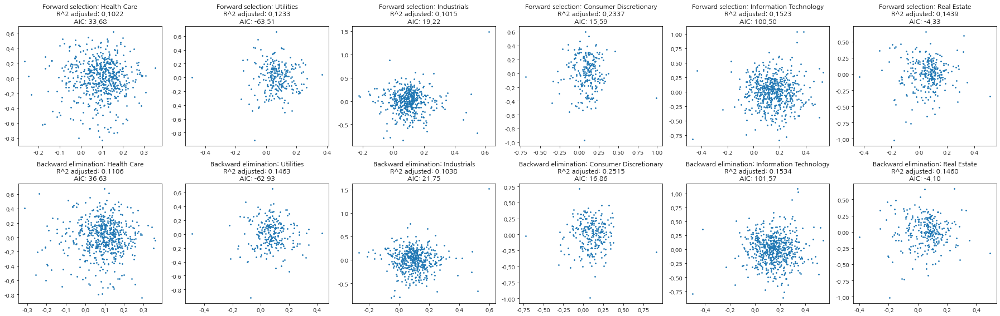

In [ ]:
# residual plot over predictors
fig, axes = plt.subplots(nrows=2, ncols=len(reg_result_forward), figsize=(25,8))

for i, model in enumerate(reg_result_forward):
    resid = model.resid # true y - y_hat
    fitted = model.fittedvalues # y_hat (prediction)
    axes[0,i].scatter(fitted, resid, s=3)
    axes[0,i].set_title(f'Forward selection: {list(industries)[i]}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')

for i, model in enumerate(reg_result_backward):
    resid = model.resid
    fitted = model.fittedvalues
    axes[1,i].scatter(fitted, resid, s=3)
    axes[1,i].set_title(f'Backward elimination: {list(industries)[i]}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')

plt.tight_layout()
plt.show()

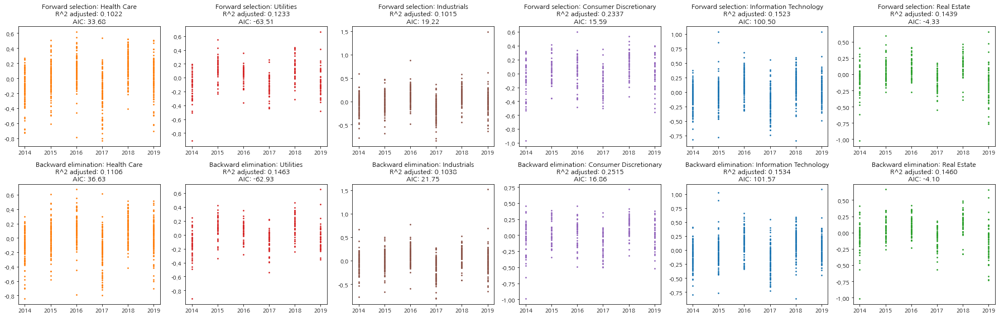

In [ ]:
# residual plot over X
fig, axes = plt.subplots(nrows=2, ncols=len(reg_result_forward), figsize=(25,8))

for i, model in enumerate(reg_result_forward):
    resid = model.resid
    fitted = model.fittedvalues # y_hat (prediction)
    idu = fitted.index.get_level_values(1)[0]
    axes[0,i].scatter(fitted.index.get_level_values(0), resid, s=3, color=industry_colormap[industry_colorcode[idu]])
    axes[0,i].set_title(f'Forward selection: {idu}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')

for i, model in enumerate(reg_result_backward):
    resid = model.resid
    fitted = model.fittedvalues
    idu = fitted.index.get_level_values(1)[0]
    axes[1,i].scatter(fitted.index.get_level_values(0), resid, s=3, color=industry_colormap[industry_colorcode[idu]])
    axes[1,i].set_title(f'Backward elimination: {idu}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')

plt.tight_layout()
plt.show()

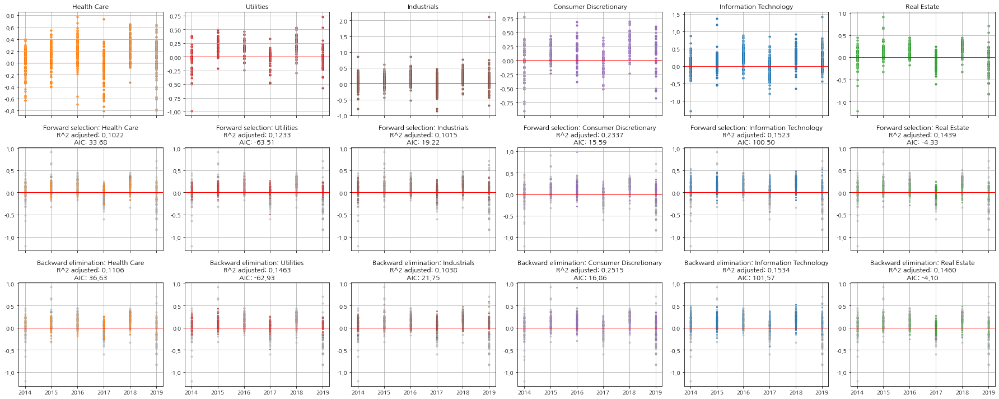

In [ ]:
# true & predicted y
fig, axes = plt.subplots(nrows=3, ncols=len(industries), figsize=(25,10), sharex=True)

chart_ = data_Y.reset_index()
for i, idu in enumerate(industries):
    chart__ = chart_[chart_['GICS Sector Predicted'] == idu]
    axes[0,i].scatter(chart__['Year'], chart__['Annual Return'], s=10, color=industry_colormap[industry_colorcode[idu]])
    axes[0,i].set_title(idu)
    axes[0,i].grid(True)
    axes[0,i].axhline(0, color='red', lw=1)

for i, model in enumerate(reg_result_forward):
    fitted = model.fittedvalues # y_hat (prediction)
    idu = fitted.index.get_level_values(1)[0]
    axes[1,i].scatter(chart__['Year'], chart__['Annual Return'], s=10, color='grey', alpha=0.3)
    axes[1,i].scatter(fitted.index.get_level_values(0), fitted, s=3, color=industry_colormap[industry_colorcode[idu]])
    axes[1,i].set_title(f'Forward selection: {idu}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')
    axes[1,i].grid(True)
    axes[1,i].axhline(0, color='red', lw=1)

for i, model in enumerate(reg_result_backward):
    fitted = model.fittedvalues
    idu = fitted.index.get_level_values(1)[0]
    axes[2,i].scatter(chart__['Year'], chart__['Annual Return'], s=10, color='grey', alpha=0.3)
    axes[2,i].scatter(fitted.index.get_level_values(0), fitted, s=3, color=industry_colormap[industry_colorcode[idu]])
    axes[2,i].set_title(f'Backward elimination: {idu}\nR^2 adjusted: {model.rsquared_adj:.4f}\nAIC: {model.aic:.2f}')
    axes[2,i].grid(True)
    axes[2,i].axhline(0, color='red', lw=1)

plt.tight_layout()
plt.show()

Finding the smallest AIC

Other options?
* Pre-selecting variables for both FS and BE \\
    * it would help reducing computational effort
    * may yield different result however depends on the order, especially in case inter-variable correlation exists

* Run one stepwise with all variables? \\
    * the more regressors selected, the higher R2 is
    * the model will be overfitted, in other words




Stepwise is not the right solution for picking a variable
* cannot deal with endogeneity
* only correlation is considered (no causality)
* can be an indicator of suitability for control variable, however

except when
* causality is clear, or
* non-linearity can be properly set, or
* no multicollinearity in the regressors

### Question 5

Do exactly the same as above with decision (or regression) tree models. Which option do you prefer in this case?


In [ ]:
# same with above (stepwise regression)
data_Y = data_return_actual.copy()

# fetch except 2020 data for industry grouping
data_X = data_fundamental_predicted.loc[idxer[data_fundamental_predicted.index.get_level_values(0) != 2020,:,:]].copy()
data_X = data_X[data_X.index.get_level_values(level=2).isin(data_Y.index.get_level_values(level=2))]

Regression tree
* Decision tree on continuous dependent variable
* Repeatative partitioning of given dataset with specific variable, one by one
* Fitted with full dataset first

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# loop over industries
tree_models = []
tree_variable_accpeted = []
tree_ccppath = []

start = timer()

reg_accounts = list(data_X.columns)
print('Coefficient of determination:')

for idu in industries:

    y = data_Y.loc[idxer[:,idu,:]]
    X = data_X.loc[idxer[:,idu,:]][reg_accounts]
    y = restore_industry_index(y, idu)
    X = restore_industry_index(X, idu)

    # fit with full data
    tree_return = DecisionTreeRegressor(
        criterion='mse', # {“squared_error”, “friedman_mse”, “absolute_error”, “poisson”},
        max_depth=None, # If None, nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples
        min_samples_split=10, # The minimum number of samples required to split an internal nod
        min_samples_leaf=0.1, # The minimum fraction of samples required to be at a leaf node
        max_features='auto', # {“auto”, “sqrt”, “log2”}
        max_leaf_nodes=None, # Best nodes are defined as relative reduction in impurity. If None then unlimited number of leaf nodes
        min_impurity_decrease=0.0, # A node will be split if this split induces a decrease of the impurity greater than or equal to this value
        ccp_alpha=0.0, # reguluarization parameter to be determined afterwards
        random_state=random_state,
    ).fit(X, y)

    print(idu, tree_return.score(X, y))
    tree_models.append(tree_return)
    tree_variable_accpeted.append(reg_accounts)

    ccp_path = tree_return.cost_complexity_pruning_path(X, y)
    tree_ccppath.append(ccp_path)

end = timer()
time_tree_full = end - start
print_time(time_tree_full)

Coefficient of determination:
Health Care 0.13023665588901367
Utilities 0.16204432514147216
Industrials 0.09622760573505429
Consumer Discretionary 0.20674074476180282
Information Technology 0.11853178882558868
Real Estate 0.13659118254265346
Time taken (seconds):  0.19338131113909185


Backward elimination approach
* Regression tree does not return variance-based stats for variables used, such as p-value
* Instead, used Gini index (feature importance) with minimum threshold as elimination criterion
* Keep removing until all remaining variables have feature importance exceeding the threshold set

In [ ]:
tree_models_backward = []
tree_variable_accpeted_backward = []
gini_threshold = 0.1

print('Coefficient of determination:')

start = timer()

for idx, idu in enumerate(industries):
    reg_accounts = list(data_X.columns)

    # 4. Repeat until all predictors have p-values below SLS
    while True:

        y = data_Y.loc[idxer[:,idu,:]]
        X = data_X.loc[idxer[:,idu,:]][reg_accounts]
        y = restore_industry_index(y, idu)
        X = restore_industry_index(X, idu)

        result_ = DecisionTreeRegressor(
            criterion='mse',
            max_depth=None,
            min_samples_split=10,
            min_samples_leaf=0.1,
            max_features='auto',
            max_leaf_nodes=None,
            min_impurity_decrease=0.0,
            ccp_alpha=0.0,
            random_state=random_state,
        ).fit(X, y)

        gini_ = pd.DataFrame(result_.feature_importances_, index=X.columns.get_level_values(level=0), columns=['gini'])
        gini_.sort_values(by='gini', ascending=True, inplace=True)

        # 3-1. If P > SLS, remove the predictor and fit model without this variable
        if gini_.iloc[0,0] < gini_threshold:
            if len(reg_accounts) == 1: # no more variable to remove
                break
            else:
                reg_accounts.remove(gini_.index[0])
                continue
        # 3-2. If P <= SLS, stop and keep current model
        else:
            print(idu, result_.score(X, y))
            tree_models_backward.append(result_)
            tree_variable_accpeted_backward.append(reg_accounts)
            break

end = timer()

time_tree_be = end - start
print_time(time_tree_be)

Coefficient of determination:
Health Care 0.10931800348436038
Utilities 0.16204432514147216
Industrials 0.07913330712508027
Consumer Discretionary 0.19106899844295555
Information Technology 0.10544105035157647
Real Estate 0.13020655330010422
Time taken (seconds):  3.7731438372284174


Generate tree images
* From models with full dataset, and
* From models constructed by backward elimination

In [ ]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image, display

tree_images = []

for tree in tree_models:

    dot_data = export_graphviz(
        tree,
        out_file=None, # returns string output without generating file
        max_depth=5, # If None, the tree is fully generated.
        feature_names=data_X.columns,
        class_names=None,
        filled=True, # paint nodes to indicate majority class for classification, extremity of values for regression, or purity of node for multi-output
        impurity=True, # show the impurity at each node
    )
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    tree_images.append(
        Image(pydot_graph.create_png(), width=800)
    )

In [ ]:
tree_images_backward = []

for idx, tree in enumerate(tree_models_backward):

    dot_data = export_graphviz(
        tree,
        out_file=None, # returns string output without generating file
        max_depth=5, # If None, the tree is fully generated.
        feature_names=tree_feature_backward[idx],
        class_names=None,
        filled=True, # paint nodes to indicate majority class for classification, extremity of values for regression, or purity of node for multi-output
        impurity=True, # show the impurity at each node
    )
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    tree_images_backward.append(
        Image(pydot_graph.create_png(), width=800)
    )


Visual comparison of trees
* No critical change in the upper layers
* In constrast, some variables in the lower layers are swapped or (dis)appeared
* Turned out that backward elimination does not return identical trees anyway

Health Care / Tree from all variables


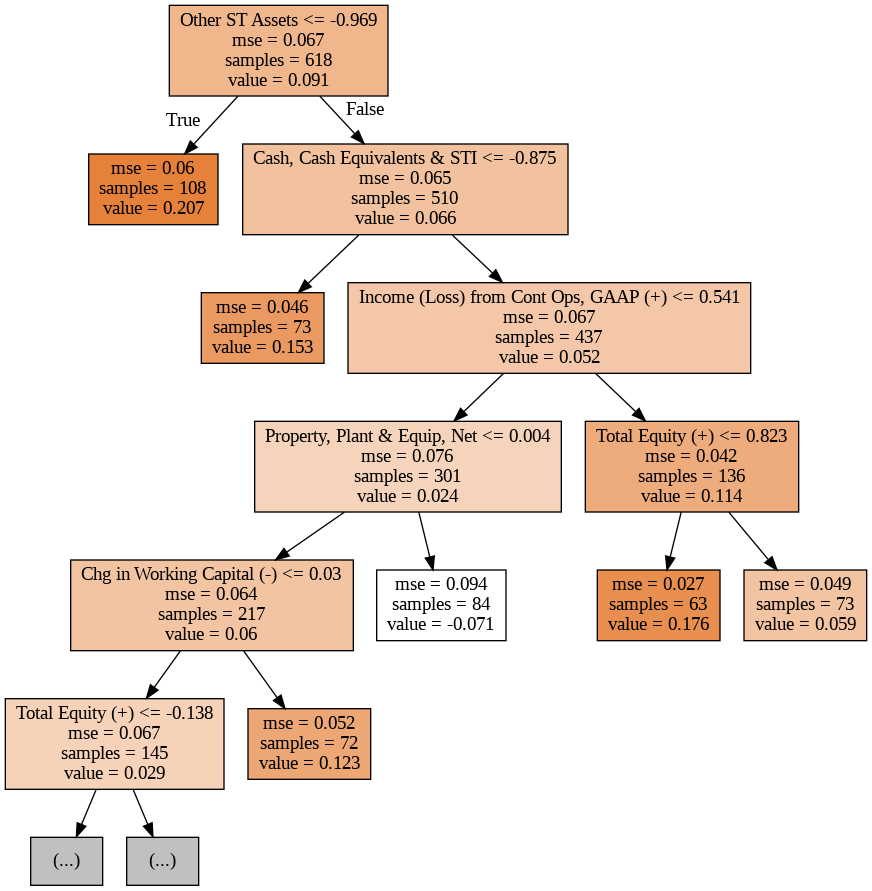

Health Care / Tree from backward elimination


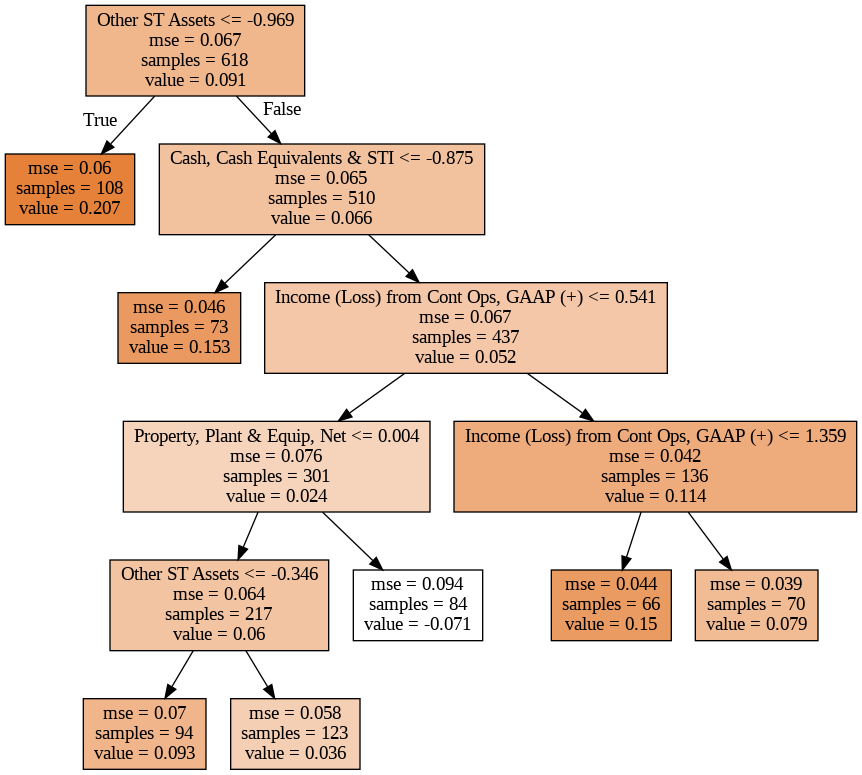

Utilities / Tree from all variables


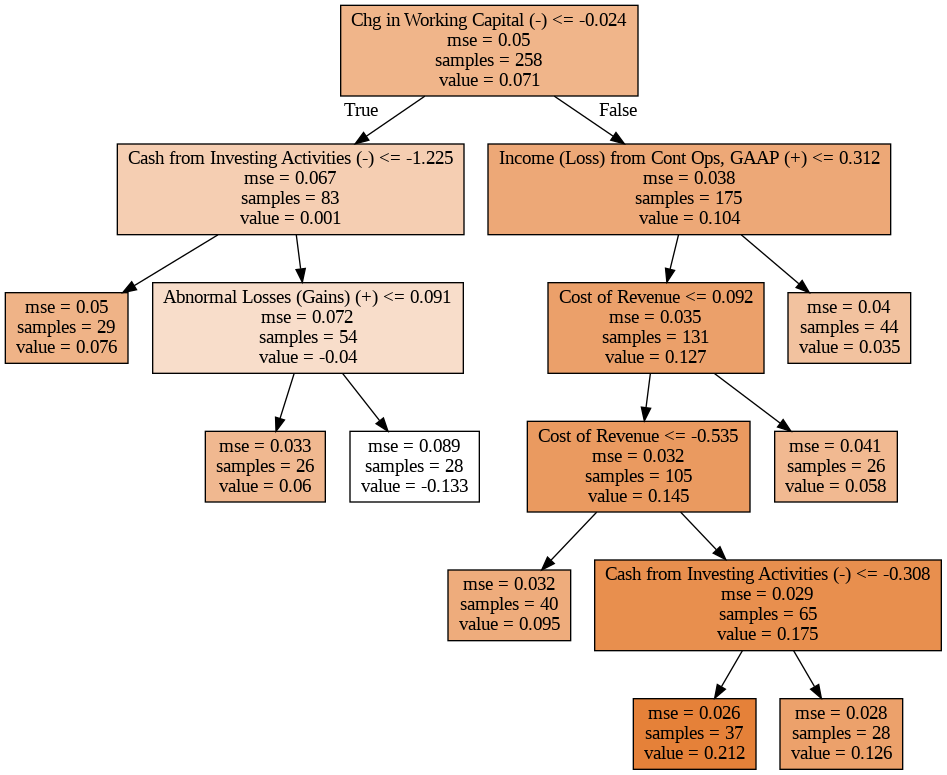

Utilities / Tree from backward elimination


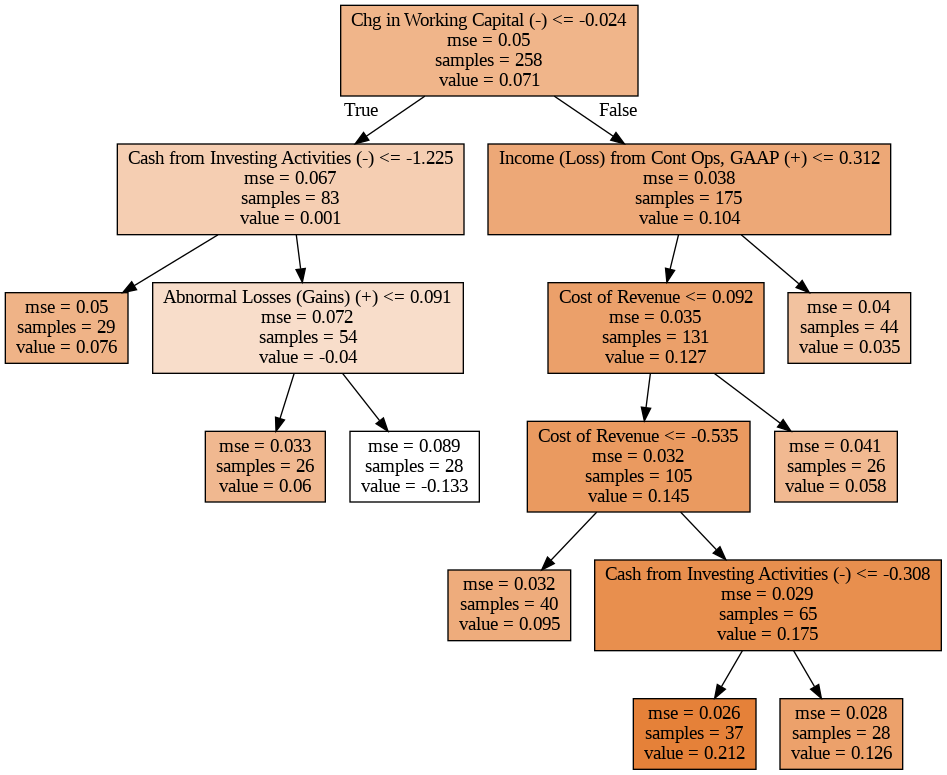

Industrials / Tree from all variables


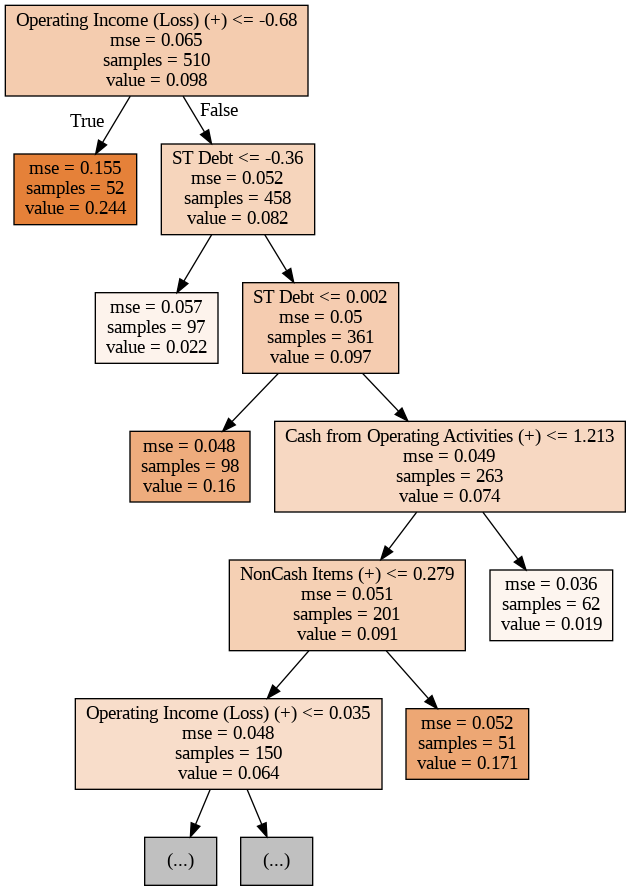

Industrials / Tree from backward elimination


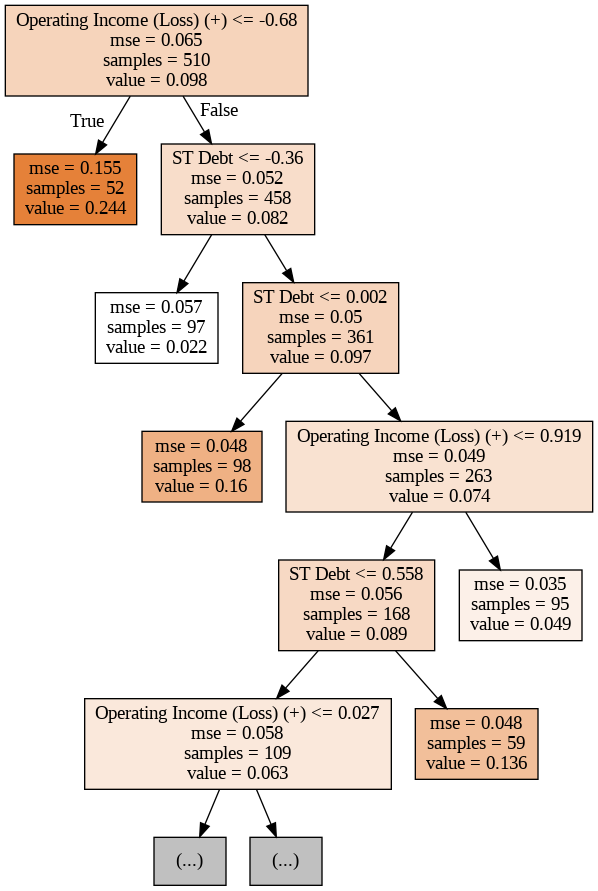

Consumer Discretionary / Tree from all variables


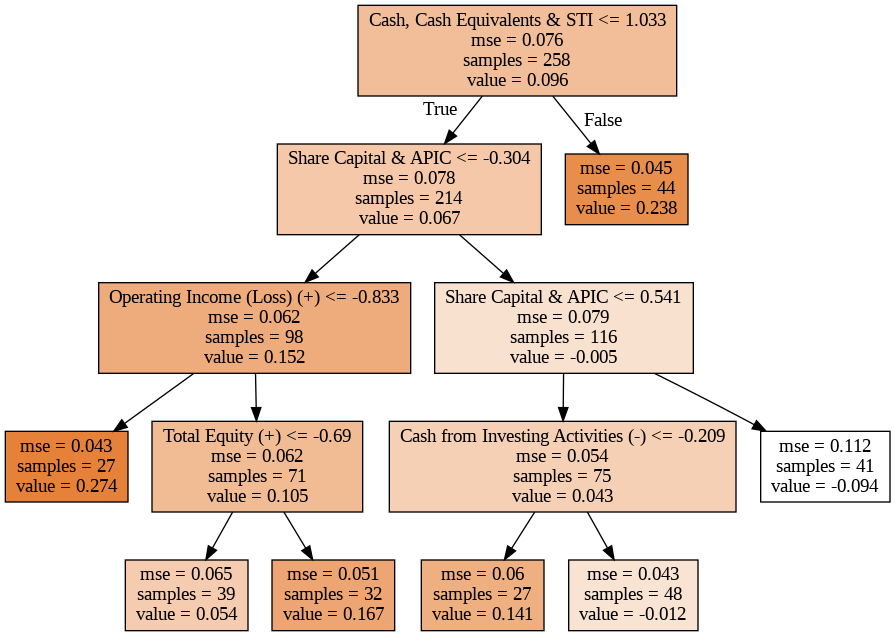

Consumer Discretionary / Tree from backward elimination


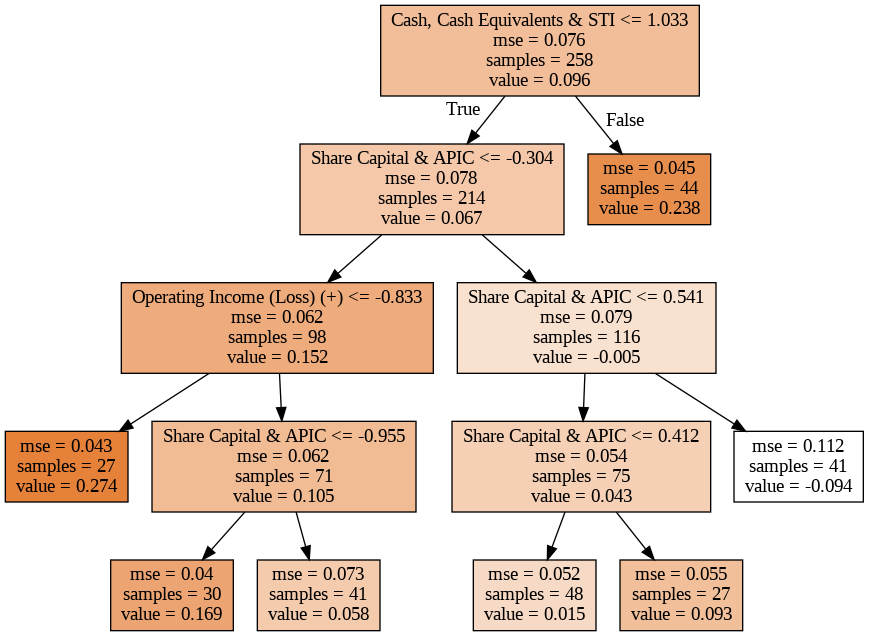

Information Technology / Tree from all variables


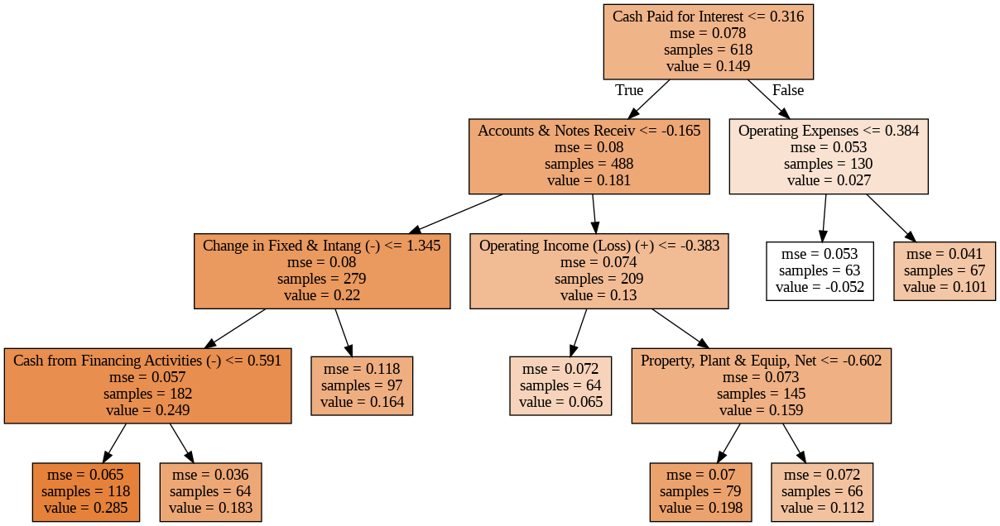

Information Technology / Tree from backward elimination


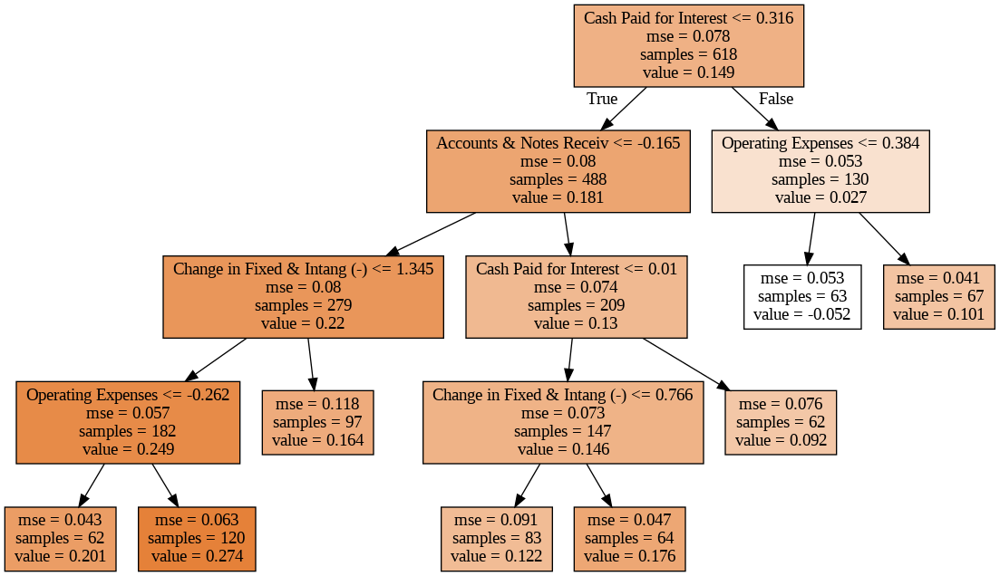

Real Estate / Tree from all variables


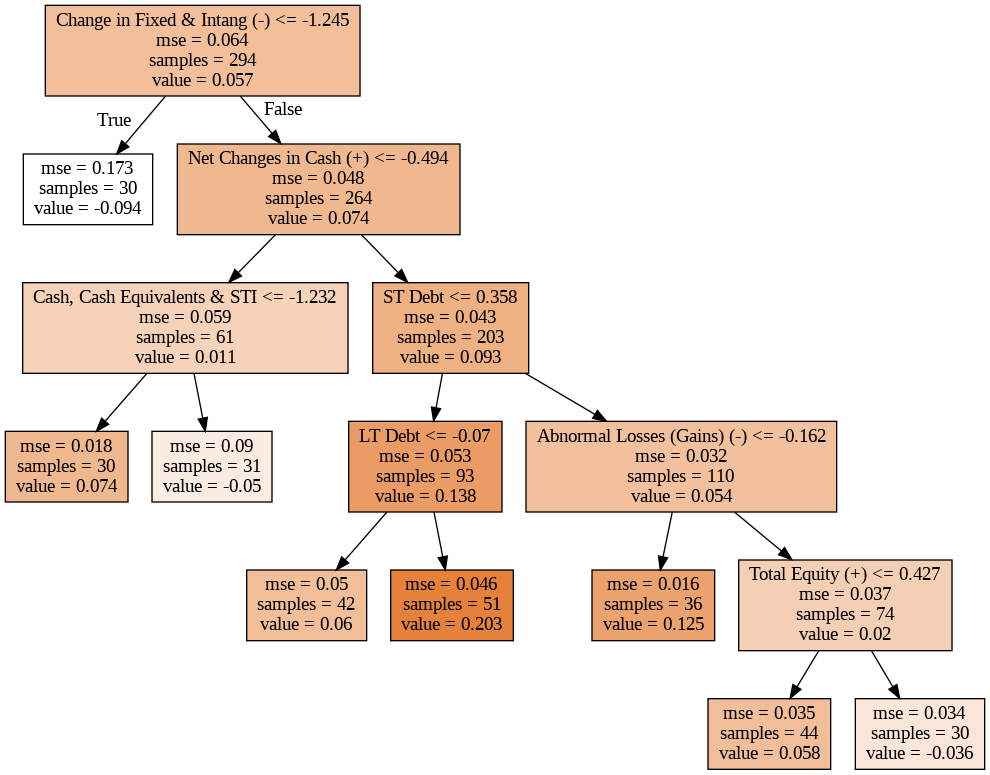

Real Estate / Tree from backward elimination


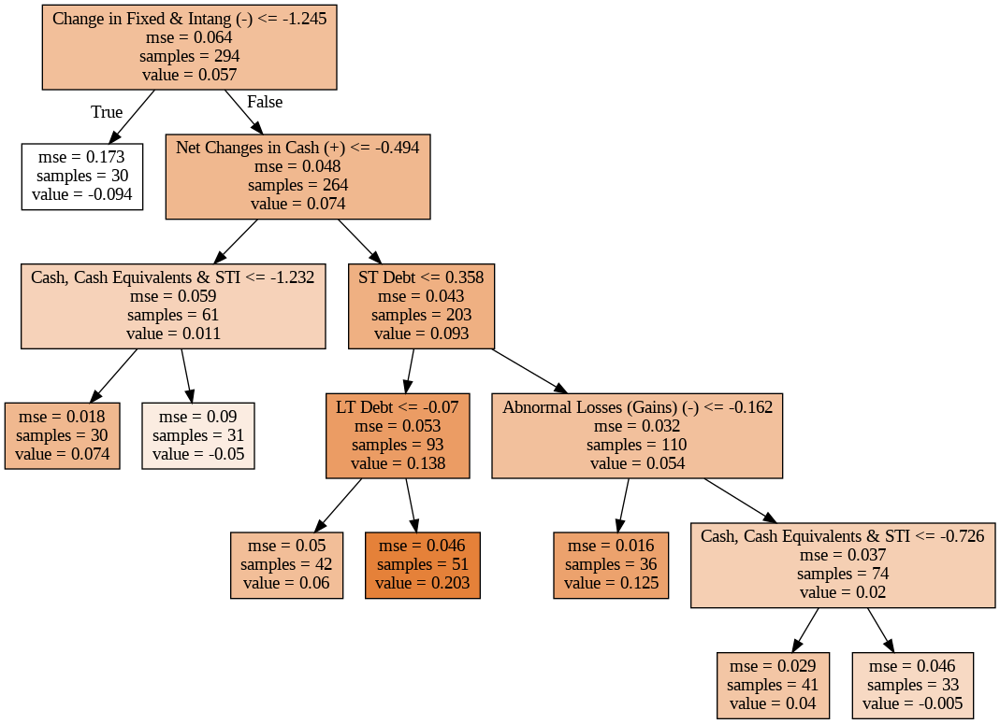

In [ ]:
paired_images = zip(tree_images, tree_images_backward)

for idx, pair in enumerate(paired_images):
    tree, tree_backward = pair
    # print('img:', tree, 'img2', tree_backward)
    print(list(industries)[idx], '/ Tree from all variables')
    display(tree)
    print(list(industries)[idx], '/ Tree from backward elimination')
    display(tree_backward)

Residual plots
* versus True y and versus index
* Prediction boundary does not include true data range
* Plus, clear patterns of fluctuation spotted
* Which implies that the models have omitted variable bias

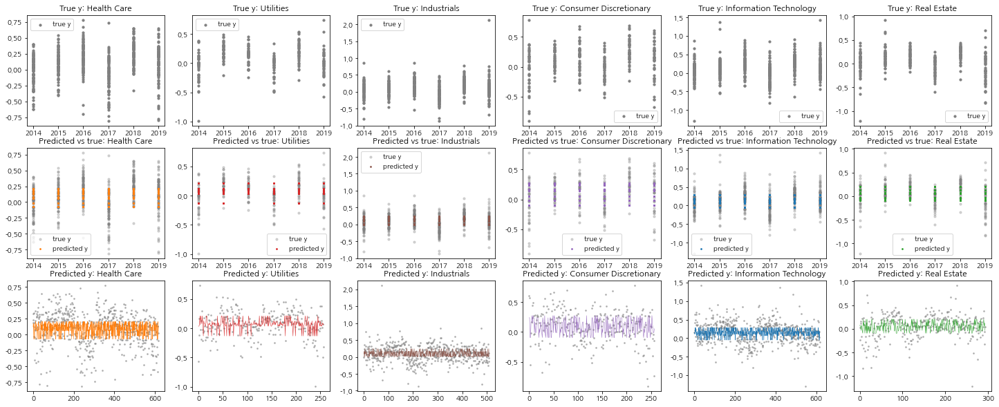

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=len(tree_models), figsize=(25,10))

reg_accounts = list(data_X.columns)

for i, idu in enumerate(industries):

    X = data_X.loc[idxer[:,idu,:]][reg_accounts]
    y_true = data_Y.loc[idxer[:,idu,:]]
    y_hat = tree_models[i].predict(X)
    years_ = X.index.get_level_values(0)

    axes[0,i].scatter(years_, y_true, s=10, c='grey', label='true y')
    axes[0,i].set_title(f'True y: {idu}')
    axes[0,i].legend()

    axes[1,i].scatter(years_, y_true, s=10, c='grey', alpha=0.3, label='true y')
    axes[1,i].scatter(years_, y_hat, s=3, color=industry_colormap[industry_colorcode[idu]], label='predicted y')
    axes[1,i].set_title(f'Predicted vs true: {idu}')
    axes[1,i].legend()

    # draw scatter chart with randomized X: a.k.a swarm chart
    axes[2,i].scatter(range(len(X.index)), y_true, s=3, c='grey', alpha=0.5, label='true y')
    axes[2,i].plot(range(len(X.index)), y_hat, lw=0.5, color=industry_colormap[industry_colorcode[idu]], label='predicted y')
    axes[2,i].set_title(f'Predicted y: {idu}')

plt.show()

Feature importance (Variable Importance Plot)
* The importance of a feature can be measured by impurity
* Gini importance: (normalized) reduction of the mse by adding the feature
* Treats frequencies as probabilities

Although we might find the logic that explains the result below, some simple test tells that important features selection by decision tree model is not stable at all - it's very susceptible to the given dataset and model parameters setting.

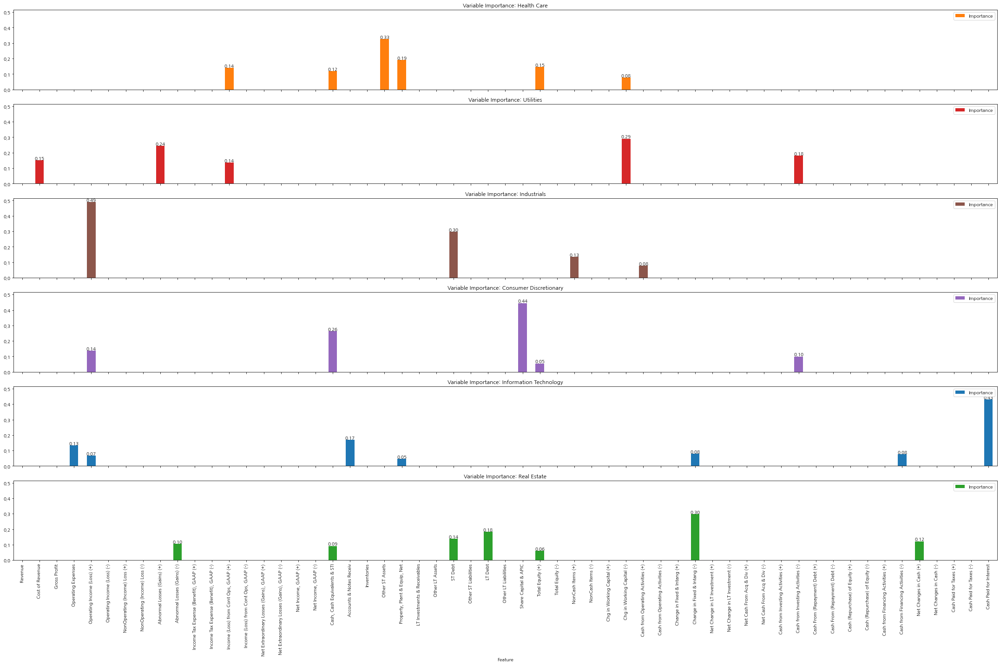

In [ ]:
fig, axes = plt.subplots(nrows=len(tree_models), ncols=1, figsize=(30,20), sharex=True, sharey=True)

tree_importance = []

for i, idu in enumerate(industries):
    X = data_X.loc[idxer[:,idu,:]]
    importance = tree_models[i].feature_importances_
    df = pd.DataFrame(zip(X.columns, importance), columns=['Feature', 'Importance']).set_index('Feature')
    tree_importance.append(df)

    axes[i].set_title(f'Variable Importance: {idu}')
    bars = df.plot(kind='bar', color=industry_colormap[industry_colorcode[idu]], ax=axes[i])
    for bar in bars.containers[0]:
        axes[i].annotate(
            f'{bar.get_height():.2f}' if bar.get_height() > 0.0 else '',
            xy=(bar.get_x()+bar.get_width()/2, bar.get_height()),
            ha='center', va='bottom'
        )

plt.tight_layout()
plt.show()

In [ ]:
# feature importances in text
tree_importance_sorted = []

for i, idu in enumerate(industries):
    df = tree_importance[i].sort_values(by='Importance', ascending=False)
    df = df[df['Importance'] != 0]
    tree_importance_sorted.append(df)
    print(f'\n{idu}', df)


Health Care                                        Importance
Feature                                          
Other ST Assets                            0.3262
Property, Plant & Equip, Net               0.1919
Total Equity (+)                           0.1472
Income (Loss) from Cont Ops, GAAP (+)      0.1392
Cash, Cash Equivalents & STI               0.1179
Chg in Working Capital (-)                 0.0777

Utilities                                        Importance
Feature                                          
Chg in Working Capital (-)                 0.2908
Abnormal Losses (Gains) (+)                0.2431
Cash from Investing Activities (-)         0.1799
Cost of Revenue                            0.1508
Income (Loss) from Cont Ops, GAAP (+)      0.1353

Industrials                                     Importance
Feature                                       
Operating Income (Loss) (+)             0.4897
ST Debt                                 0.2978
NonCash Items (+)        

### Question 6

Since you learned that baseline stepwise regression tend to have higher $R^2$, or overfitting in machine learning terms, you would like to perform boot-strapping to optimize your analysis. Run your optimization and draw barplots to confirm that your adjustment is successful.

Optimism in step-wise regression $R^2$
* In regression, the more variables added, the higher $R^2$ achieved regardless of its causality
* It can be partly mitigated by subtracting the $R^2$ difference between training set and test set data from the full model $R^2$
* However, this can be done only when enough data is provided

Bootstrapping
* In case we are short on data, better to use sampling with replacement to generate larger sample dataset (Bootstrapping)
* The optimism is measured by:
$$\text{training } R^2 - \text{test } R^2, \text{or}$$
$$R^2 \text{ with all data} - \text{True } R^2$$
* True $R^2$ can only be approximated from emprirical distribution - to be specific, by bootstrapping (or resampling)

In [ ]:
data_Y = data_return_actual.copy()

data_X = data_fundamental_predicted.loc[idxer[data_fundamental_predicted.index.get_level_values(0) != 2020,:,:]].copy()
data_X = data_X[data_X.index.get_level_values(level=2).isin(data_Y.index.get_level_values(level=2))]

print('Count of data by identifiable industry:')
for idx, idu in enumerate(industries):
    y = data_Y.loc[idxer[:,idu,:]]
    print(idu, ':', len(y))

Count of data by identifiable industry:
Health Care : 618
Utilities : 258
Industrials : 510
Consumer Discretionary : 258
Information Technology : 618
Real Estate : 294



Implementation
* For given dataset, we may consider both approaches considering data counts are neither too small nor large enough
* Here we implement backward elimination with the latter approach (bootstrapping)
* We are interested in relationship of the data at hand to (true) population
* To see how well the model generalized to population, we:
    1. Develop model with all available data and calculate $R^2$
    2. Develop N models with with bootstrapped samples and test them on full samples
    3. See the difference of $R^2$ between two provides an estimate of bias for modeling procedure

https://stats.stackexchange.com/questions/405048/stepwise-regression-limitations-avoided-on-bootstrap-independent-datasets

In [ ]:
reg_result_bootstrap = {}
reg_original_rsquared = {}
reg_bootstrap_rsquared = {}
num_repeat = 50

start = timer()

# 1. Develop model with all available data and calculate $R^2$
# (skipepd to use exisiting full models)

# For each industry,
for idx, idu in enumerate(industries):
    reg_original_rsquared[idu] = reg_result_backward[idx].rsquared
    reg_bootstrap_rsquared[idu] = []
    reg_result_bootstrap[idu] = []

    # 2-1. Develop N models with bootstrapped samples
    for i in range(num_repeat):
        reg_accounts = list(data_X.columns) # reset predictor selection

        # repeat until all predictors have p-values below SLS
        while True:

            y = data_Y.loc[idxer[:,idu,:]]
            X = data_X.loc[idxer[:,idu,:]][reg_accounts]
            y = restore_industry_index(y, idu)
            X = restore_industry_index(X, idu)

            # set identical random_state for X and Y to extract paired records
            X_bootstrap = X.sample(n=len(X), replace=True, random_state=i)
            y_bootstrap = y.sample(n=len(y), replace=True, random_state=i)
            result_ = run_regression(y_bootstrap, X_bootstrap)

            # predictor selection procedure is the same as above
            pvalue_ = result_.pvalues.sort_values(ascending=False)
            if pvalue_.index[0] == 'const':
                break
            if pvalue_[0] >= significance_level:
                if len(reg_accounts) == 1:
                    break
                else:
                    reg_accounts.remove(pvalue_.index[0])
                    continue
            else:
                # 2-2. Test the model on full sample
                result_ = run_regression(y, X)
                reg_result_bootstrap[idu].append(result_)
                reg_bootstrap_rsquared[idu].append(result_.rsquared)
                break

end = timer()
time_swr_bootstrap = end - start
print_time(time_swr_bootstrap)

Time taken (seconds):  227.3707252049353


Barplot illustration
* As expected, boxplots suggests that the full model exhibits higher $R^2$
* Empirial optimism in stepwise regression can be expressed by average difference of $R^2$

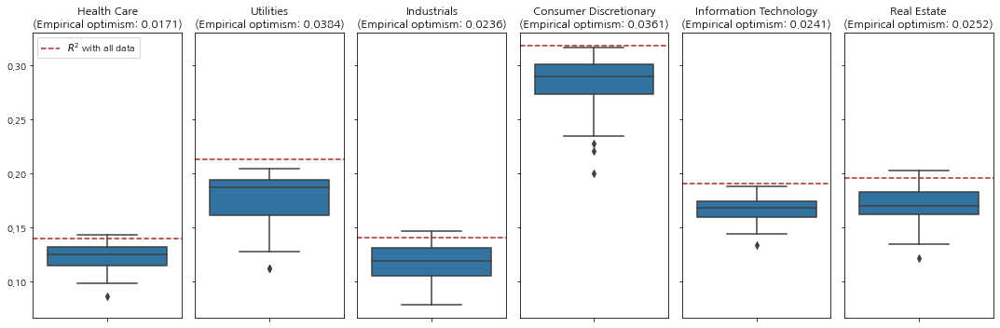

In [ ]:
reg_bootstrap_rsquared_avg = dict([(idu, np.mean(reg_bootstrap_rsquared[idu])) for idu in reg_bootstrap_rsquared])

fig, axes = plt.subplots(nrows=1, ncols=len(industries), figsize=(15,5), sharey=True)

for i, idu in enumerate(reg_bootstrap_rsquared):
    sns.boxplot(y=reg_bootstrap_rsquared[idu], ax=axes[i])
    axes[i].axhline(reg_original_rsquared[idu], c='firebrick', ls='--', label='$R^2$ with all data')
    axes[i].set_title(f'{idu}\n(Empirical optimism: {reg_original_rsquared[idu] - reg_bootstrap_rsquared_avg[idu]:.4f})')

axes[0].legend(loc='upper left')
plt.tight_layout()
plt.show()

### Question 7

Again, do the same step with decision (or regression) tree models.

Genralization of regression tree
* Pruning: tree model specific way of avoiding overfitting
* Can be done by setting proper alpha for cost complexity pruning & target impurity
* Minimal cost complexity pruning: recursively finds the node with the weakest link
* The weakest link is characterized by an effective alpha, where the nodes with the smallest effective alpha are pruned first

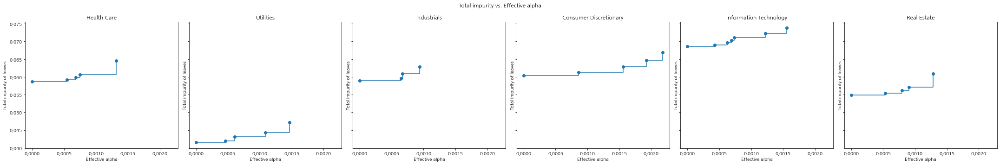

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(industries), figsize=(30,5), sharey=True, sharex=True)

for i, idu in enumerate(industries):

    ccp_alphas = tree_ccppath[i].ccp_alphas
    impurities = tree_ccppath[i].impurities

    # why [:-1]? last element implies "trivial tree" with only one node
    axes[i].plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle='steps-post')
    axes[i].set_xlabel('Effective alpha')
    axes[i].set_ylabel('Total impurity of leaves')
    axes[i].set_title(idu)

plt.suptitle('Total impurity vs. Effective alpha')
plt.tight_layout()
plt.show()

Implementation
* Iterate pruning to obtain optimal tradeoff between prediction error and model complexity
* Based on cost complexity pruning, which tries to minimize complexity measure
* Predictor selection procedure, which was done in Q5, need not to be replicated here - pruning has almost the same effect of controlling the number of variables

Reference: \\
https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py

In [ ]:
tree_result_pruned = {}

reg_accounts = list(data_X.columns)

start = timer()

for idx, idu in enumerate(industries):
    ccp_alphas = tree_ccppath[idx].ccp_alphas
    tree_result_pruned[idu] = []
    # print(f'\nIndustry {idx}: {idu}')

    y = data_Y.loc[idxer[:,idu,:]]
    X = data_X.loc[idxer[:,idu,:]][reg_accounts]
    y = restore_industry_index(y, idu)
    X = restore_industry_index(X, idu)

    for c in range(len(ccp_alphas)):

        result_ = DecisionTreeRegressor(
            criterion='mse',
            max_depth=None,
            min_samples_split=10,
            min_samples_leaf=0.1,
            max_features='auto',
            max_leaf_nodes=None,
            min_impurity_decrease=0.0,
            ccp_alpha=ccp_alphas[c], # reguluarization parameter set
            random_state=random_state,
        ).fit(X, y)

        tree_result_pruned[idu].append(result_)

end = timer()
time_tree_pruned = end - start
print_time(time_tree_pruned)

Time taken (seconds):  0.35690664104186


As anticipated, increased alpha reduces number of nodes and depth of layers

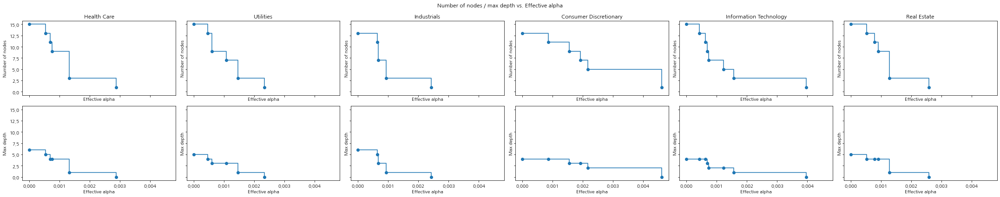

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=len(industries), figsize=(30,6), sharey=True, sharex=True)

for i, idu in enumerate(industries):

    ccp_alphas = tree_ccppath[i].ccp_alphas
    node_counts = [model.tree_.node_count for model in tree_result_pruned[idu]]
    tree_depth = [model.tree_.max_depth for model in tree_result_pruned[idu]]

    axes[0,i].plot(ccp_alphas, node_counts, marker='o', drawstyle='steps-post')
    axes[0,i].set_xlabel('Effective alpha')
    axes[0,i].set_ylabel('Number of nodes')
    axes[0,i].set_title(idu)

    axes[1,i].plot(ccp_alphas, tree_depth, marker='o', drawstyle='steps-post')
    axes[1,i].set_xlabel('Effective alpha')
    axes[1,i].set_ylabel('Max depth')

plt.suptitle('Number of nodes / max depth vs. Effective alpha')
plt.tight_layout()
plt.show()

Measuring $R^2$ difference
* As we did in Q6, we implement bootstrapping approach rather than train-test comparison, which is
* Comparing the model constructed with full data, and
* The penalized model fitted with full data (in this case, regularized by alpha)
* Unlike bootstrapping, there is no stochasticity - selecting the regularization parameter, alpha, deteremines the difference


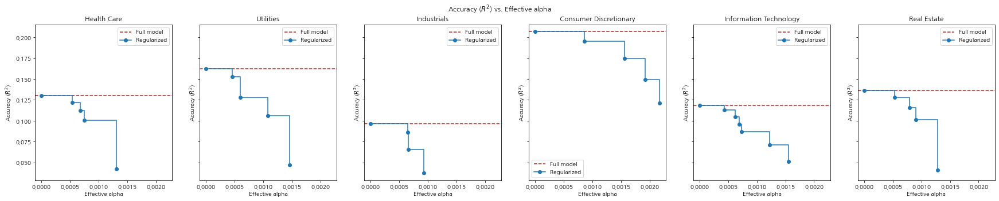

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(industries), figsize=(30,5), sharey=True, sharex=True)

for i, idu in enumerate(industries):

    reg_accounts = list(data_X.columns)

    y = data_Y.loc[idxer[:,idu,:]]
    X = data_X.loc[idxer[:,idu,:]][reg_accounts]

    ccp_alphas = tree_ccppath[i].ccp_alphas[:-1]
    full_score = tree_models[i].score(X, y)
    regularized_scores = [model.score(X, y) for model in tree_result_pruned[idu]][:-1]

    axes[i].axhline(full_score, c='firebrick', ls='--', label='Full model')
    axes[i].plot(ccp_alphas, regularized_scores, marker="o", label="Regularized", drawstyle="steps-post")
    axes[i].set_xlabel("Effective alpha")
    axes[i].set_ylabel("Accuracy ($R^2$)")
    axes[i].set_title(idu)
    axes[i].legend()

plt.suptitle("Accuracy ($R^2$) vs. Effective alpha")
plt.show()

### Question 8

Why are two models’ chosen variables are inconsistent? Are the inconsistent variables consistently appearing as important variables over the horizon of your research?

Feature selection results
* Models doesn't seem to make consistent results
* Only some of variables selected 3 out of 4 mdoels
* Considering we haven't considered the uncertainty (degree of p-values or feature importance), the consistency would be worse in reality

Comparison of selected variable for each model:


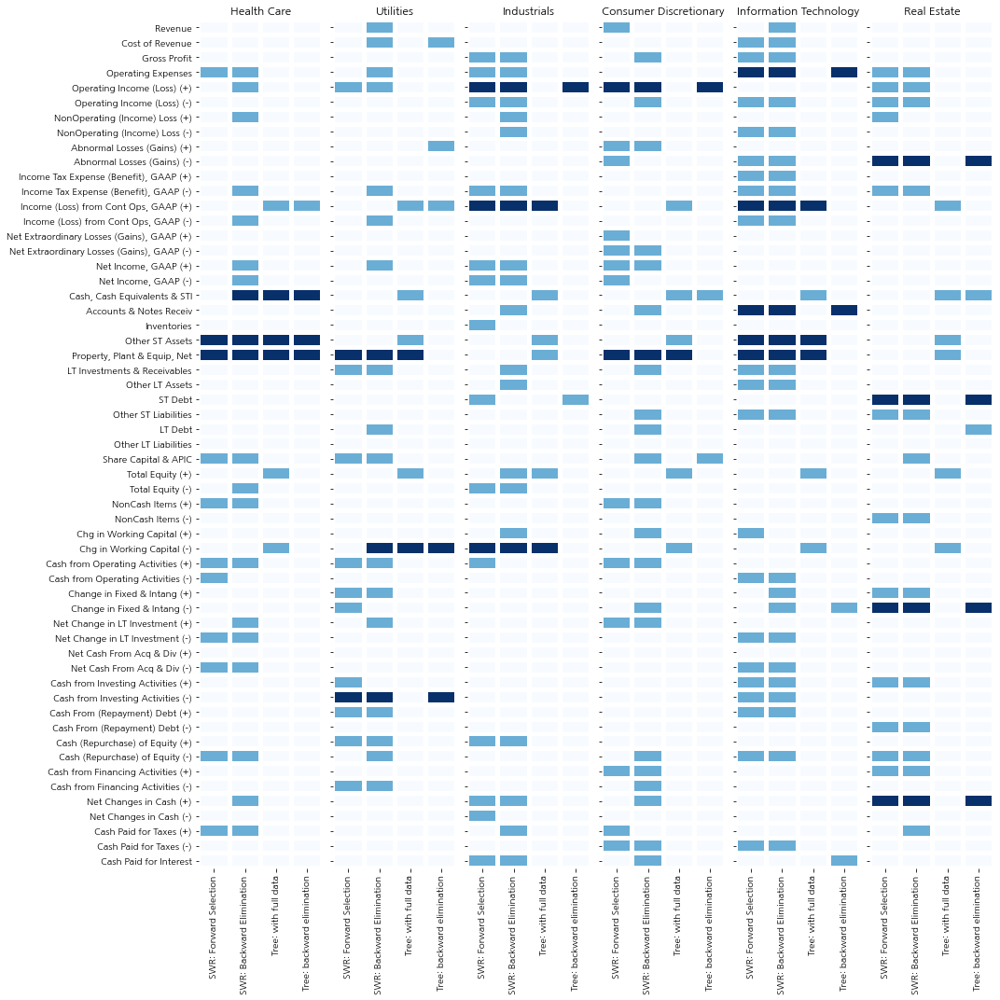

In [ ]:
print('Comparison of selected variable for each model:')

fig, axes = plt.subplots(nrows=1, ncols=len(industries), figsize=(15,15), sharey=True)

for idx, idu in enumerate(industries):

    all_accounts = list(data_X.columns)
    df = pd.DataFrame([], index=all_accounts)

    df['SWR: Forward Selection'] = df.index.isin(reg_result_forward[idx].params.index)
    df['SWR: Backward Elimination'] = df.index.isin(reg_result_backward[idx].params.index)
    # df['Tree: with full data'] = df.index.isin(tree_variable_accpeted[idx])
    df['Tree: with full data'] = df.index.isin(tree_importance[0][tree_importance[0]['Importance'] > 0].index)
    df['Tree: backward elimination'] = df.index.isin(tree_variable_accpeted_backward[idx])

    # determine the accounts selected consistently (3/4 models)
    select_count = (df.sum(axis=1) >= 3)
    acct_to_emphasize = select_count[select_count == True].index
    df.loc[df.index.isin(acct_to_emphasize)] = np.where(df[df.index.isin(acct_to_emphasize)], 2, 0)

    axes[idx].set_title(idu)
    sns.heatmap(df, cmap='Blues', cbar=False, linewidths=4, vmax=2, ax=axes[idx])

plt.tight_layout()
plt.show()

Result from SWR Bootstrapping
* Different dataset yields different variable selection, even for the exactly same modeling procedure
* For Healthcare, only 3 out of 57 variabels are consistently selected (>80%)

Comparison of selected variable for bootstarpped SWR:


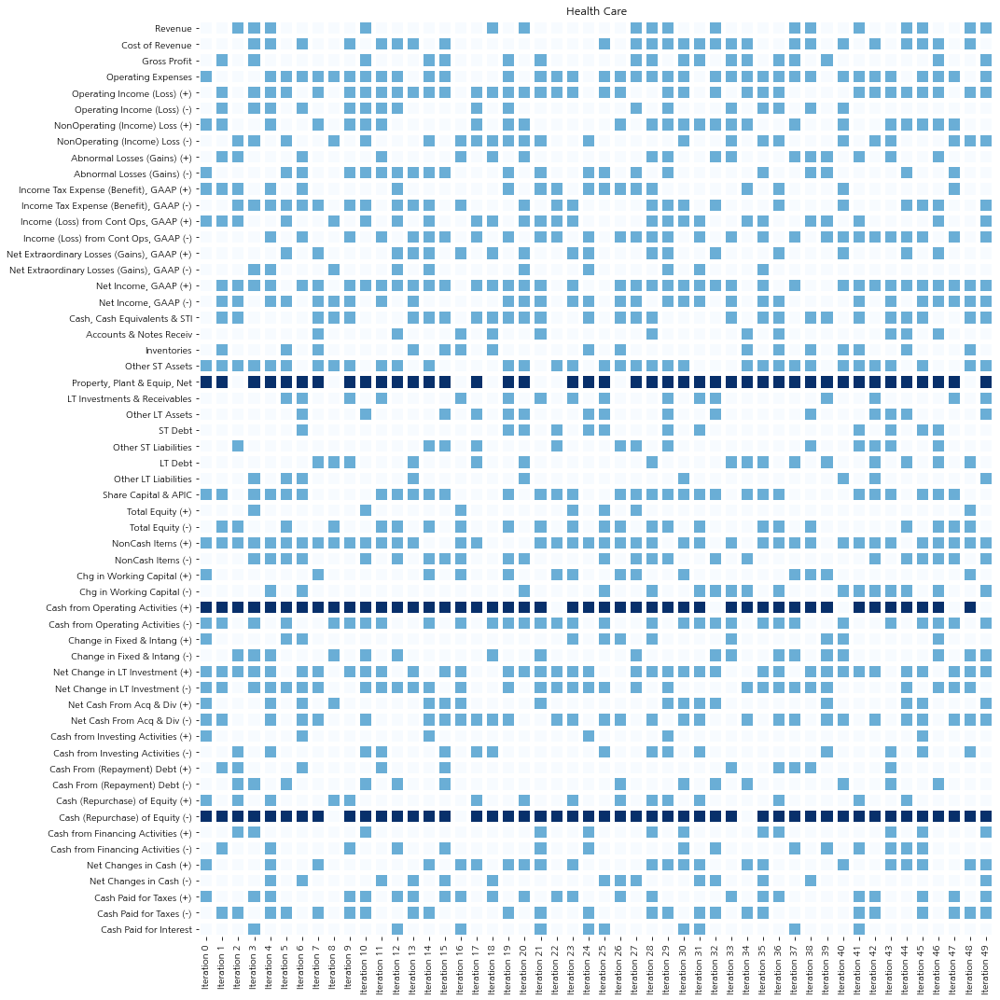

In [ ]:
print('Comparison of selected variable for bootstarpped SWR:')

# For simplicity's sake, taking Healthcare as an example
idu = list(industries)[0]

fig = plt.figure(figsize=(15,15))

all_accounts = list(data_X.columns)
df = pd.DataFrame([], index=all_accounts)

for i in range(num_repeat):
    df[f'Iteration {i}'] = df.index.isin(reg_result_bootstrap[idu][i].params.index)

# determine the accounts selected consistently throughout bootstrapping
acct_count = (df.sum(axis=1) > (num_repeat * 0.8))
acct_to_emphasize = acct_count[acct_count == True].index
df.loc[df.index.isin(acct_to_emphasize)] = np.where(df[df.index.isin(acct_to_emphasize)], 2, 0)

plt.title(idu)
sns.heatmap(df, cmap='Blues', cbar=False, linewidths=4, vmax=2)

plt.tight_layout()
plt.show()

Result from pruned decision trees
* Expected behavior - pruning eliminates nodes (and the variable used too)
* As illustrated in Q7, pruning leads to low $R^2$, which is too low already
* Ppruning doesn't seem to be essential in the given dataset

Comparison of selected variable for pruned decision tree:


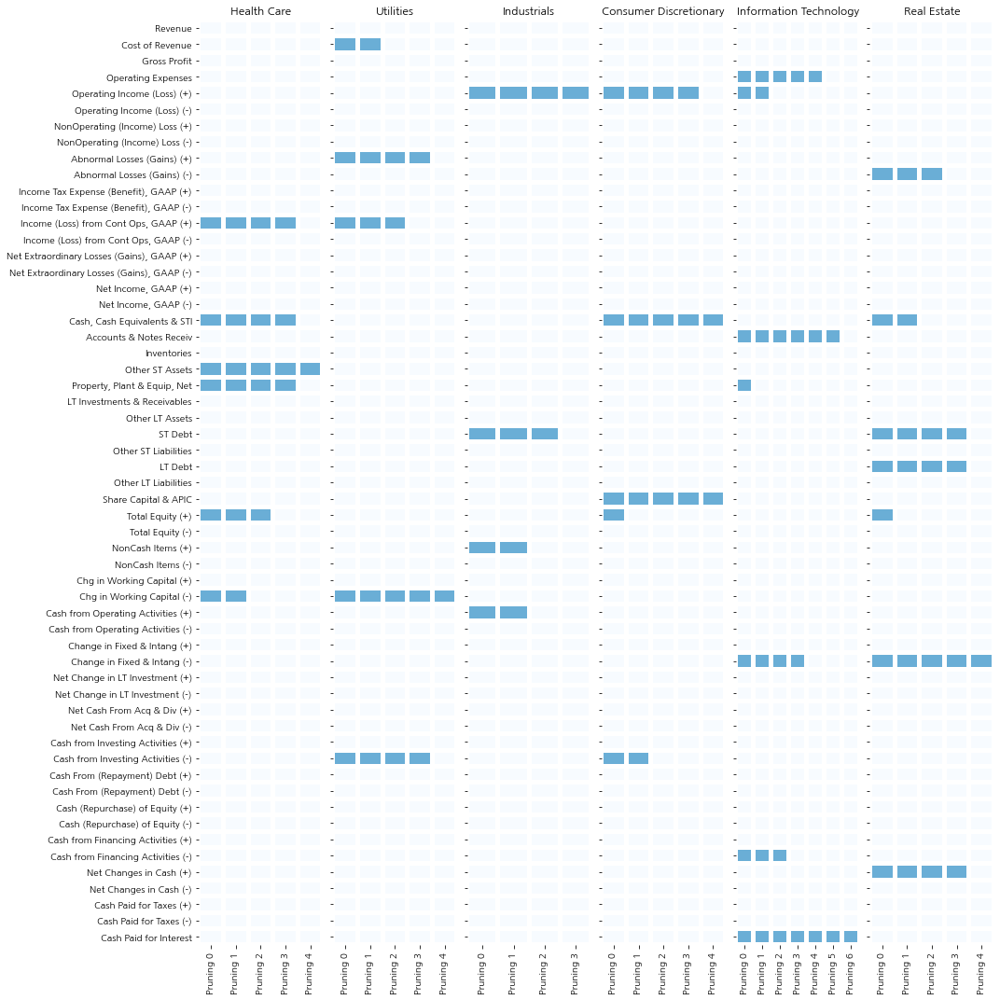

In [ ]:
print('Comparison of selected variable for pruned decision tree:')

fig, axes = plt.subplots(nrows=1, ncols=len(industries), figsize=(15,15), sharey=True)

for idx, idu in enumerate(industries):

    all_accounts = list(data_X.columns)
    df = pd.DataFrame([], index=all_accounts)

    idu_model = tree_result_pruned[idu]

    for i in range(len(idu_model)-1): # skip one-node trees
        df[f'Pruning {i}'] = df.index.isin(df[tree_result_pruned[idu][i].feature_importances_ > 0].index)

    axes[idx].set_title(idu)
    sns.heatmap(df, cmap='Blues', cbar=False, linewidths=4, vmax=2, ax=axes[idx])

plt.tight_layout()
plt.show()

### Question 9

How much computational power do you need for each model and how much adjustment do you need for mitigating overfitting?

SWR fitting
* As summarized below:
* SWR required enormous computational cost - which is expected considering its iteration process
* Forward selection is more complicated than backward elimination which led to higher cost
* If, in any form, non-linear terms are added, computational cost will soar

Decision (regression) tree
* Took relatively low computational cost
* More nodes require more cost but it's still cheaper than SWR iteration
* It's because tree works like SVM, which is determined by some critical datapoints

Regularization
* With 50 iterations, SWR bootstrapping took more than 5 times of fitting itself
* Pruning for tree model wasn't that heavy - it's just cutting out nodes and layers


In [ ]:
print('Time taken for model fitting and regularization:')

time_comparison = {
    'SWR: Forward Selection': [time_swr_fs],
    'SWR: Backward Elimination': [time_swr_be],
    'SWR: Backward Eliminiation with bootstrapping': [time_swr_bootstrap],
    'Tree: with full data': [time_tree_full],
    'Tree: backward elimination': [time_tree_be],
    'Tree: with full data and pruning': [time_tree_pruned],
}
pd.DataFrame(time_comparison, index=['Time taken (seconds)']).T

Time taken for model fitting and regularization:


,Time taken (seconds)
SWR: Forward Selection,39.2504
SWR: Backward Elimination,4.9962
SWR: Backward Eliminiation with bootstrapping,228.1061
Tree: with full data,0.2263
Tree: with backward elimination,3.0287
Tree: with full data and pruning,0.3569


### Question 10

In considerations of non-Gaussianity and non-linearity in statistical modeling, evaluate the statement. ”The ’Factor Machine’ can not only can replace all human research works for the past a century but it also pick variables that traditional statistical models cannot, most of which of such machine-found vari- ables promise ’investor’s alpha’.”

### Bonus

To win the job, or to win a decent package offer for the new job, you would like to give a punch line on your presentation. How would you do so?

### Credit modeling

#### Data processing


In [ ]:
name_translate = {
    'HYP': 'Hyeyoung Park',
    'JYP': 'Junyoung Park',
    'YSS': 'Yeonshim Shim',
    'HBM': 'Taylor Moon',
    'Group2': 'Group2',
    'Group3': 'Group3',
    'SIAI': 'SIAI',
}
all_player = [
    (name_translate['HYP'], {'color': 'red'}),
    (name_translate['JYP'], {'color': 'gold'}),
    (name_translate['YSS'], {'color': 'green'}),
    (name_translate['HBM'], {'color': 'blue'}),
    (name_translate['Group2'], {'color': 'grey'}),
    (name_translate['Group3'], {'color': 'grey'}),
    (name_translate['SIAI'], {'color': 'pink'}),
]
name_index_list = list(name_translate.keys())
name_color_dict = dict([(v1, v2['color']) for v1,v2 in all_player])

# Raw data copied from:
# https://docs.google.com/spreadsheets/d/1CIbNb0n5dqlTXpCTwf8AynXe4DDkWCNeaxZFFOTtHuw/edit#gid=799109341
data_edge = """
HBM>HYP|HBM>JYP|HBM>YSS|HYP>HBM|HYP>JYP|HYP>YSS|JYP>HBM|JYP>HYP|JYP>YSS|YSS>HBM|YSS>HYP|YSS>JYP%5|6|4|1|3|1|4|5|5|5|5|9
""".replace('\n','')
data_coalition_score = """
HBM|HBM+HYP+JYP|HBM+JYP|HBM+YSS+HYP|HBM+YSS+HYP+JYP|HYP|HYP+JYP|HYP+YSS+HBM+JYP|JYP|JYP+HYP|JYP+YSS|JYP+YSS+HYP+HBM|YSS|YSS+HYP+HBM+JYP|YSS+JYP%6.666666667|6.666666667|23.33333333|4.545454545|34.58333333|49.47330447|13.05555556|2.5|82.32323232|2.5|8.333333333|24.58874459|19.9025974|21.38888889|15.13888889
""".replace('\n','')
data_peer = {"HYP": "69", "JYP": "79", "YSS": "70", "HBM": "60"}

edge_df = pd.DataFrame([(k, int(v)) for k,v in zip(data_edge.split('%')[0].split('|'), data_edge.split('%')[1].split('|'))], columns=['path', 'score']).groupby('path').sum()
all_edge = [(
    name_translate.get(k.split('>')[0]),
    name_translate.get(k.split('>')[1]),
    {'color': name_color_dict.get(name_translate[k.split('>')[0]]), 'weight': v}
    ) for k, v in edge_df.to_dict()['score'].items()]

all_coliation_score = pd.DataFrame([
    ('+'.join(name_translate.get(i,i) for i in k.split('+')), float(v))
    for k,v in zip(data_coalition_score.split('%')[0].split('|'), data_coalition_score.split('%')[1].split('|'))])
# drop duplicates (ignoring order)
all_coliation_score[0] = all_coliation_score[0].str.split('+').map(lambda x: '+'.join(sorted(x)))
all_coliation_score = all_coliation_score.groupby(by=0).sum()

#### Model

##### Shapley value: Subgame approach

* Grand coalition의 모든 부분집합 (개별 coalition)에 대해 loop
* 개별 coalition의 모든 부분집합에 대해 loop

For every $S \subseteq N$: \
$\quad$ if $v(S) - accum(S) \neq 0$: \
$\quad\quad$ For every $T \subseteq S$ \
$\quad\quad\quad$ $x(T) = v(S) - accum(S)$ \
$\quad\quad\quad$ $accum(S) = accum(S) + x(T)$

In [ ]:
# Shapley value - Sub game approach

def calculate_shapley_by_subgame(df_vS):
    """
    Calculate Shapley value by sub-game approach
    Inputs
    - df_vS: DataFrame with coalition - v(S) pair
    """

    vAll = df_vS.copy()
    N = sorted(list(set('+'.join(vAll.index).split('+')))) # agents
    # grand coalition의 모든 부분집합이 아닌 존재하는 coalition만 사용
    S = vAll.index.to_list()
    vAll.columns = ['vS']
    vAll['accum'] = 0
    shapley = pd.DataFrame(np.zeros((len(N), len(S))), index=N, columns=S) # agents X coalition

    # calculate marginal contribution
    xT = pd.DataFrame(np.zeros((len(S), len(S))), index=S, columns=S)
    # return xT
    # return vAll
    for s in S: # S ⊆ N (s = marginal contribution 확인 대상)
        # accum이 꽉 찼으면 계산 X
        if vAll.loc[s,'vS'] != vAll.loc[s,'accum']:
            for t in S: # T ⊆ S (T = grand coalition의 모든 부분집합)
                # (marginal contribution 따지는 대상인) s가 부분집합으로 포함된 coalition만 업데이트
                if set(s.split('+')).issubset(t.split('+')):
                    xT.loc[t,s] = vAll.loc[s,'vS'] - vAll.loc[s,'accum']
            # s가 포함된 (=s가 부분집합인) 모든 S의 accum 업데이트
            includes_s = [set(s.split('+')).issubset(s_list) for s_list in vAll.index.str.split('+')]
            vAll.loc[includes_s, 'accum'] += xT.loc[t,s]
    # print(xT)

    # distribute marginal contribution to agents
    for s in S:
        include_s = [set(s.split('+')).issubset(s_list) for s_list in xT.index.str.split('+')]
        contribution = xT.loc[include_s, s].mean(axis=0)
        # print(contribution)

        # s에 포함된 agent에게 동등하게 배분
        for agent in N:
            if agent in s.split('+'):
                shapley.loc[agent, s] = contribution / len(s.split('+'))

    return shapley.sum(axis=1).to_frame(name='shapley_value')

##### Network thoery: Eigenvector Centrality

In [ ]:
# https://networkx.org/documentation/stable/tutorial.html
import networkx as nx
G = nx.DiGraph()

G.add_nodes_from(all_player)
G.add_edges_from(all_edge)

G.nodes.data()
# G.edges.data()

NodeDataView({'Hyeyoung Park': {'color': 'red'}, 'Junyoung Park': {'color': 'gold'}, 'Yeonshim Shim': {'color': 'green'}, 'Taylor Moon': {'color': 'blue'}, 'Group2': {'color': 'grey'}, 'Group3': {'color': 'grey'}, 'SIAI': {'color': 'pink'}})

#### Calculation

In [ ]:
# 1. Shapley value

shapley_value = calculate_shapley_by_subgame(all_coliation_score)
shapley_value['shapley_percent'] = shapley_value['shapley_value'] / shapley_value['shapley_value'].sum()
shapley_value.sort_values(by='shapley_percent', ascending=False)


,shapley_value,shapley_percent
Junyoung Park,136.4913,0.4333
Hyeyoung Park,81.7537,0.2595
Yeonshim Shim,53.9191,0.1712
Taylor Moon,42.8359,0.1360


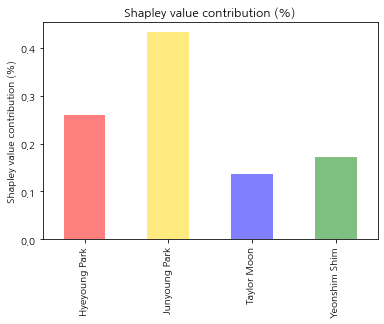

In [ ]:
shapley_value['shapley_percent'].plot(
    kind='bar',
    ylabel='Shapley value contribution (%)',
    color=[name_color_dict.get(x,'black') for x in shapley_value.index],
    alpha=0.5,
)
plt.title('Shapley value contribution (%)')
plt.show()

In [ ]:
from scipy.stats import hmean

# 2. Network centralities

# eigen centrality
centralirty_eigen = nx.eigenvector_centrality(G)
centrality_df = pd.DataFrame(centralirty_eigen.values(), index=centralirty_eigen.keys(), columns=['eigen'])

# out-degree centrality
# centrality_out = nx.out_degree_centrality(G)
# centrality_df['out-degree'] = centrality_out.values()

# weighted degree centrality: not implemented in NetworkX
# https://frhyme.github.io/python-lib/network-centrality/
def return_weighted_degree_centrality(input_g, normalized=False):
    w_d_centrality = {n:0.0 for n in input_g.nodes()}
    for u, v, d in input_g.edges(data=True):
        w_d_centrality[u]+=d['weight']
        w_d_centrality[v]+=d['weight']
    if normalized==True:
        weighted_sum = sum(w_d_centrality.values())
        return {k:v/weighted_sum for k, v in w_d_centrality.items()}
    else:
        return w_d_centrality
centrality_df['weighted-degree'] = centrality_df.index.map(return_weighted_degree_centrality(G)) / 100

centrality_df.drop(['Group2', 'Group3', 'SIAI'], axis=0, inplace=True)

# centrality_df['simple_mean'] = centrality_df.mean(axis=1)
centrality_df['harmonic_mean'] = centrality_df.apply(hmean, axis=1)

# use harmonic mean of centralities as a performance indicator
centrality_df['centrality_percent'] = centrality_df['harmonic_mean'] / centrality_df['harmonic_mean'].sum()

centrality_df.sort_values(by='centrality_percent', ascending=False)

,eigen,weighted-degree,harmonic_mean,centrality_percent
Junyoung Park,0.5000,0.3200,0.3902,0.2835
Yeonshim Shim,0.5000,0.2900,0.3671,0.2667
Taylor Moon,0.5000,0.2500,0.3333,0.2422
Hyeyoung Park,0.5000,0.2000,0.2857,0.2076


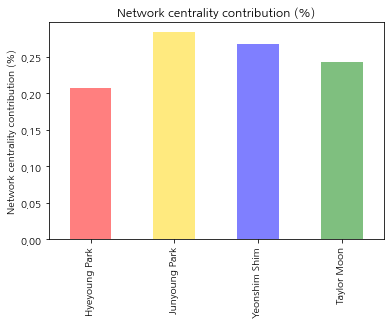

In [ ]:
centrality_df['centrality_percent'].plot(
    kind='bar',
    ylabel='Network centrality contribution (%)',
    color=[name_color_dict.get(x,'black') for x in shapley_value.index],
    alpha=0.5,
)
plt.title('Network centrality contribution (%)')
plt.show()

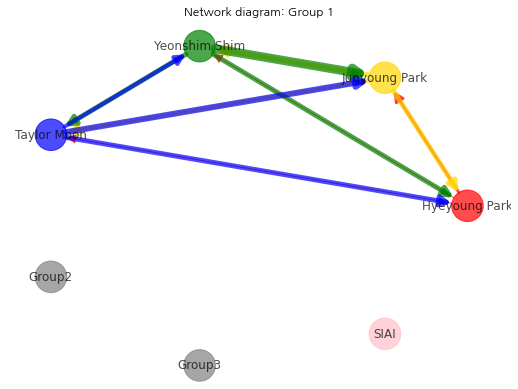

In [ ]:
edges = G.edges()
edge_colors = nx.get_edge_attributes(G,'color').values()
weights = [G[u][v]['weight'] for u,v in edges]

node_colors = nx.get_node_attributes(G,'color').values()

plt.figure(figsize=(7,5))
plot_options = {
    'node_color': node_colors,
    'node_size': 1000,
    'width': weights,
    'edge_color': edge_colors,
    'alpha': 0.7,
    'arrowsize': 20,
    'with_labels': True,
}
nx.draw_circular(G, **plot_options)
plt.title('Network diagram: Group 1')
plt.show()

In [ ]:
# 3. Peer review

peer_df = pd.DataFrame(
    data=[int(v[1]) for v in data_peer.items()],
    index=[name_translate.get(v[0]) for v in data_peer.items()],
    columns=['peer_review'],
)
peer_df['peer_percent'] = peer_df['peer_review'] / peer_df['peer_review'].sum()
peer_df.sort_values(by='peer_review', ascending=False)

,peer_review,peer_percent
Junyoung Park,79,0.2842
Yeonshim Shim,70,0.2518
Hyeyoung Park,69,0.2482
Taylor Moon,60,0.2158


In [ ]:
# Harmonic mean of three performance indicators

summary_df = shapley_value['shapley_percent'].to_frame()
summary_df.rename(columns={'shapley_percent': 'Shapley value'}, inplace=True)
summary_df['Network centrality'] = centrality_df['centrality_percent']
summary_df['Peer review'] = summary_df.index.map(peer_df['peer_percent'])

summary_df['Harmonic_mean'] = summary_df.apply(hmean, axis=1)
summary_df.sort_values(by='Harmonic_mean', ascending=False)

,Shapley value,Network centrality,Peer review,Harmonic_mean
Junyoung Park,0.4333,0.2835,0.2842,0.3207
Hyeyoung Park,0.2595,0.2076,0.2482,0.2362
Yeonshim Shim,0.1712,0.2667,0.2518,0.2212
Taylor Moon,0.1360,0.2422,0.2158,0.1861


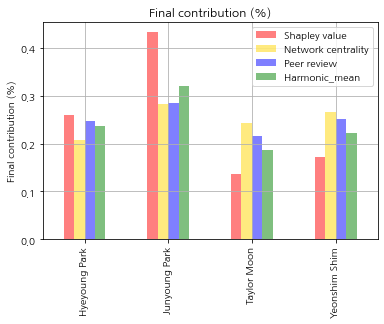

In [ ]:
summary_df.plot(
    kind='bar',
    ylabel='Final contribution (%)',
    color=[name_color_dict.get(x,'black') for x in shapley_value.index],
    alpha=0.5,
)
plt.title('Final contribution (%)')
plt.grid(True)
plt.show()